In [1]:
# Load Packages
import xarray as xr
import numpy as np
from scipy.interpolate import griddata
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import pandas as pd  
import netCDF4
import h5netcdf
import rasterio
from rasterio.plot import show
from pyproj import Transformer
from rasterio.windows import from_bounds
from rasterio.enums import Resampling
from rasterio.warp import reproject, calculate_default_transform
import math
from rasterio.mask import mask
import geopandas as gpd
from shapely.geometry import box
from scipy.stats import linregress

# Step 1: Calculate low resolution temperature at sea level

In [2]:
# Load the air temperature in low resolution (this data set has the extent that covers the SAFE project)
lowres_temperature = xr.open_dataset('lowres_temperature.nc')
lowres_temperature

<xarray.Dataset> Size: 770kB
Dimensions:    (longitude: 20, latitude: 20, time: 240)
Coordinates:
  * longitude  (longitude) float32 80B 116.0 116.1 116.2 ... 117.7 117.8 117.9
  * latitude   (latitude) float32 80B 5.92 5.82 5.72 5.62 ... 4.22 4.12 4.02
  * time       (time) datetime64[ns] 2kB 2001-01-01 2001-02-01 ... 2020-12-01
Data variables:
    t2m        (time, latitude, longitude) float64 768kB ...
Attributes:
    Conventions:  CF-1.6
    history:      2023-06-29 11:40:13 GMT by grib_to_netcdf-2.24.0: /opt/ecmw...

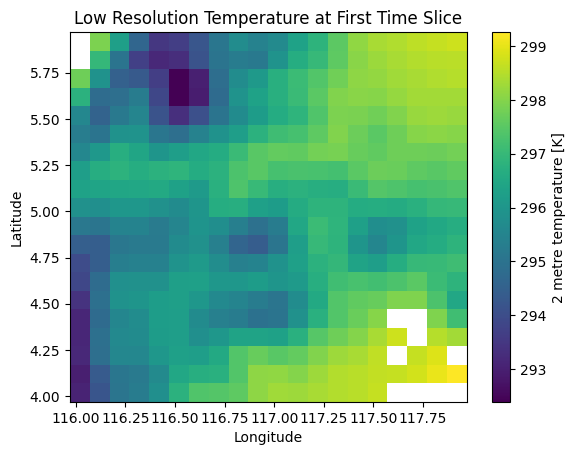

In [3]:
temperature_slice = lowres_temperature['t2m'].isel(time=1)


# Use xarray's plotting function which handles the colorbar automatically
p = temperature_slice.plot(cmap='viridis')  # 'p' is the mappable (image or contour set) returned by .plot()

# Enhance the plot with titles and labels
plt.title('Low Resolution Temperature at First Time Slice')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()


/var/folders/vq/91h3xwfn35s185lcs4zf91x80000gn/T/ipykernel_67393/1480424026.py:16: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


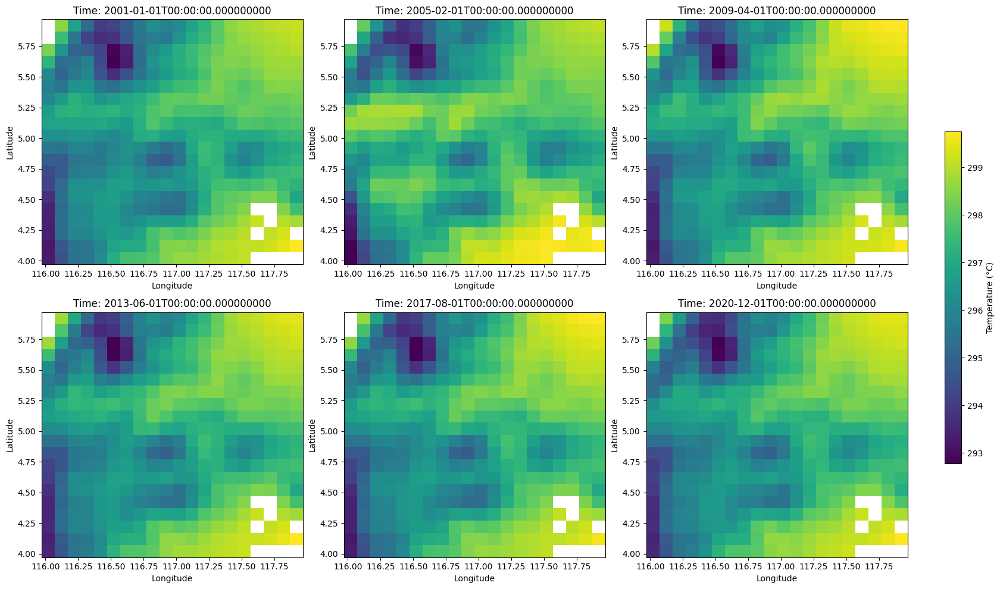

In [4]:
# Specified point in time
time_points = [1, 50, 100, 150, 200, 240]

fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(18, 10))

for ax, t in zip(axs.flatten(), time_points):
    data = lowres_temperature['t2m'].isel(time=t-1)  
    im = ax.pcolormesh(data.longitude, data.latitude, data, cmap='viridis', shading='auto')  

    ax.set_title(f'Time: {data.time.values}')
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')

fig.colorbar(im, ax=axs.ravel().tolist(), orientation='vertical', fraction=0.02, pad=0.05, label='Temperature (°C)')

plt.tight_layout()
plt.subplots_adjust(right=0.85) 
plt.show()

In [5]:
# Load geopotential in low resolution
geopotential_in = xr.open_dataset('lowres_geopotential.nc')
geopotential_in

<xarray.Dataset> Size: 52MB
Dimensions:    (longitude: 3600, latitude: 1801, time: 1)
Coordinates:
  * longitude  (longitude) float32 14kB 0.0 0.1 0.2 0.3 ... 359.7 359.8 359.9
  * latitude   (latitude) float32 7kB 90.0 89.9 89.8 89.7 ... -89.8 -89.9 -90.0
  * time       (time) datetime64[ns] 8B 2013-08-09T12:00:00
Data variables:
    z          (time, latitude, longitude) float64 52MB ...
Attributes:
    Conventions:               CF-1.6
    history:                   Fri Jun 12 14:41:56 2020: ncpdq -U geo_1279l4_...
    NCO:                       4.7.2
    nco_openmp_thread_number:  1

In [6]:
# clip geopotential to same extent as temperature
min_lon = 116.0
min_lat = 4.0
max_lon = 118.0
max_lat = 6.0

geopotential = geopotential_in.sel(latitude=slice(max_lat,min_lat), longitude=slice(min_lon,max_lon))
geopotential

<xarray.Dataset> Size: 4kB
Dimensions:    (longitude: 21, latitude: 21, time: 1)
Coordinates:
  * longitude  (longitude) float32 84B 116.0 116.1 116.2 ... 117.8 117.9 118.0
  * latitude   (latitude) float32 84B 6.0 5.9 5.8 5.7 5.6 ... 4.3 4.2 4.1 4.0
  * time       (time) datetime64[ns] 8B 2013-08-09T12:00:00
Data variables:
    z          (time, latitude, longitude) float64 4kB ...
Attributes:
    Conventions:               CF-1.6
    history:                   Fri Jun 12 14:41:56 2020: ncpdq -U geo_1279l4_...
    NCO:                       4.7.2
    nco_openmp_thread_number:  1

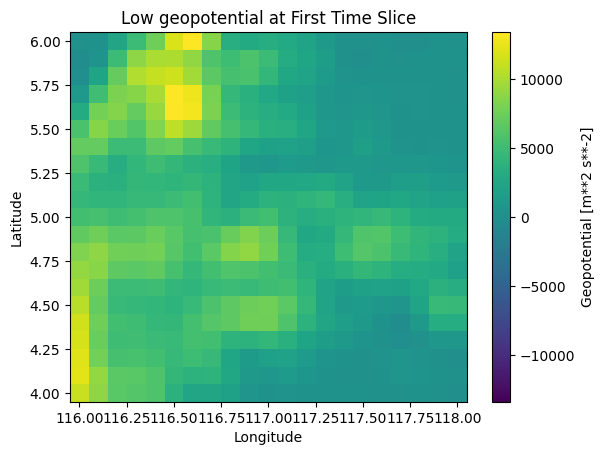

In [7]:
geopotential_slice = geopotential['z'].isel(time=0)


# Use xarray's plotting function which handles the colorbar automatically
p = geopotential_slice.plot(cmap='viridis')  # 'p' is the mappable (image or contour set) returned by .plot()

# Enhance the plot with titles and labels
plt.title('Low geopotential at First Time Slice')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

In [8]:
# Interpolate geopotential data onto a lowres_temperature latitude and longitude grid
geopotential= geopotential.interp(
    latitude=lowres_temperature['latitude'],
    longitude=lowres_temperature['longitude'],
    method='linear'  # Select the interpolation method, 'linear' is one of the commonly used interpolation methods
)
geopotential

<xarray.Dataset> Size: 3kB
Dimensions:    (time: 1, latitude: 20, longitude: 20)
Coordinates:
  * time       (time) datetime64[ns] 8B 2013-08-09T12:00:00
  * latitude   (latitude) float32 80B 5.92 5.82 5.72 5.62 ... 4.22 4.12 4.02
  * longitude  (longitude) float32 80B 116.0 116.1 116.2 ... 117.7 117.8 117.9
Data variables:
    z          (time, latitude, longitude) float64 3kB -110.5 ... 74.56
Attributes:
    Conventions:               CF-1.6
    history:                   Fri Jun 12 14:41:56 2020: ncpdq -U geo_1279l4_...
    NCO:                       4.7.2
    nco_openmp_thread_number:  1

In [9]:
# Convert geopotential to altitude
gravity = 9.81
earth_radius = 6371000 # in meters
altitude = (geopotential * earth_radius) / (gravity * earth_radius - geopotential)
altitude

<xarray.Dataset> Size: 3kB
Dimensions:    (time: 1, latitude: 20, longitude: 20)
Coordinates:
  * time       (time) datetime64[ns] 8B 2013-08-09T12:00:00
  * latitude   (latitude) float32 80B 5.92 5.82 5.72 5.62 ... 4.22 4.12 4.02
  * longitude  (longitude) float32 80B 116.0 116.1 116.2 ... 117.7 117.8 117.9
Data variables:
    z          (time, latitude, longitude) float64 3kB -11.26 123.9 ... 7.601

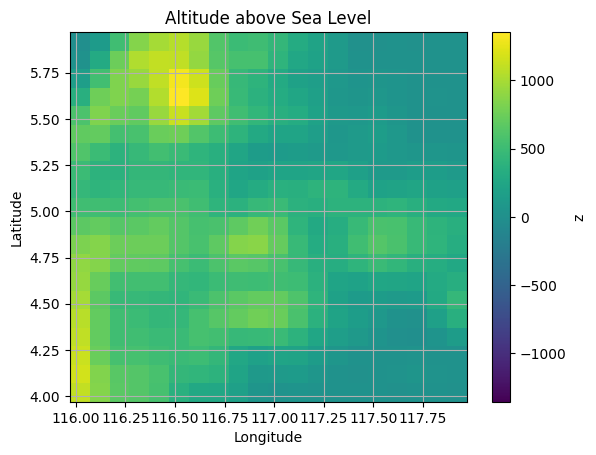

In [10]:
# plot altitude above Sea Level
altitude['z'].plot(cmap='viridis')

plt.title('Altitude above Sea Level')  
plt.xlabel('Longitude')  
plt.ylabel('Latitude')  
plt.grid(True)  

plt.show()

In [11]:
# Adjust low resolution temperature to mean sea level
# Specify the lapse rate (-0.006 K m^-1)
lapse_rate = -0.006

lowres_temperature_sealevel = lowres_temperature['t2m'].values - (altitude['z'].values * lapse_rate)
lowres_temperature_sealevel = xr.DataArray(
    lowres_temperature_sealevel,
    dims=['time','latitude','longitude'],
    coords={
        'time': lowres_temperature.time,
        'latitude': lowres_temperature.latitude,
        'longitude': lowres_temperature.longitude
    }
)
lowres_temperature_sealevel

<xarray.DataArray (time: 240, latitude: 20, longitude: 20)> Size: 768kB
array([[[         nan, 298.65411633, 299.41389372, ..., 298.40276789,
         298.50393161, 298.60633604],
        [         nan, 298.69287835, 299.59928575, ..., 298.37149762,
         298.4587706 , 298.49432702],
        [298.6933379 , 299.12651356, 299.56206743, ..., 298.3448078 ,
         298.43417772, 298.42375612],
        ...,
        [299.91456804, 299.22067472, 298.83217681, ..., 298.67114509,
         298.82309443,          nan],
        [299.9634416 , 299.35274445, 298.90178761, ..., 298.89914704,
         299.01735991, 299.12817532],
        [299.61212763, 299.25354414, 298.92178718, ...,          nan,
                  nan,          nan]],

       [[         nan, 298.64159698, 299.35954143, ..., 298.60048198,
         298.72073007, 298.83183698],
        [         nan, 298.69409974, 299.50676472, ..., 298.56783764,
         298.63251472, 298.65402504],
        [298.6872309 , 299.09857404, 299.46405009, ..., 298.53137662,
         298.60746382, 298.58818707],
...
        [300.47702264, 299.68740211, 299.24791076, ..., 299.27848614,
         299.45303137,          nan],
        [300.49765133, 299.83977762, 299.37904958, ..., 299.59519224,
         299.72302363, 299.86116787],
        [300.16420033, 299.77126497, 299.46637881, ...,          nan,
                  nan,          nan]],

       [[         nan, 299.1081717 , 299.6812276 , ..., 299.41179679,
         299.50563211, 299.53765338],
        [         nan, 299.0676954 , 299.85608506, ..., 299.37625162,
         299.43695916, 299.43037728],
        [299.16510357, 299.45171125, 299.72130742, ..., 299.30742351,
         299.38320536, 299.37125701],
        ...,
        [300.48557244, 299.65915724, 299.20027617, ..., 299.28474581,
         299.4595964 ,          nan],
        [300.51826245, 299.82435744, 299.33233104, ..., 299.60084122,
         299.72607713, 299.82712135],
        [300.17992585, 299.74989048, 299.41172117, ...,          nan,
                  nan,          nan]]])
Coordinates:
  * time       (time) datetime64[ns] 2kB 2001-01-01 2001-02-01 ... 2020-12-01
  * latitude   (latitude) float32 80B 5.92 5.82 5.72 5.62 ... 4.22 4.12 4.02
  * longitude  (longitude) float32 80B 116.0 116.1 116.2 ... 117.7 117.8 117.9

/var/folders/vq/91h3xwfn35s185lcs4zf91x80000gn/T/ipykernel_67393/1193115438.py:16: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


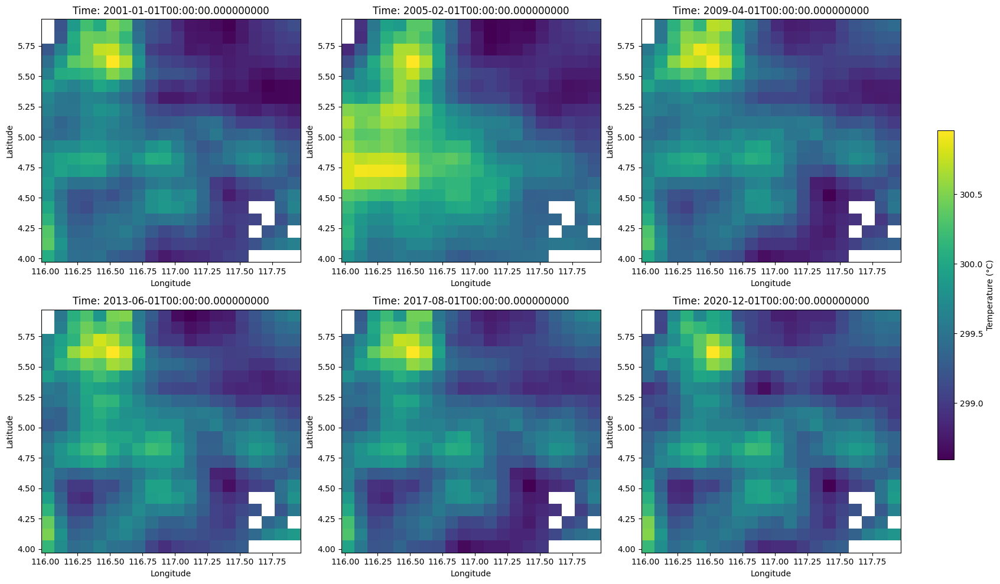

In [12]:
# Specified point in time
time_points = [1, 50, 100, 150, 200, 240]

fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(18, 10))

for ax, t in zip(axs.flatten(), time_points):
    data = lowres_temperature_sealevel.isel(time=t-1)  
    im = ax.pcolormesh(data.longitude, data.latitude, data, cmap='viridis', shading='auto')  

    ax.set_title(f'Time: {data.time.values}')
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')

fig.colorbar(im, ax=axs.ravel().tolist(), orientation='vertical', fraction=0.02, pad=0.05, label='Temperature (°C)')

plt.tight_layout()
plt.subplots_adjust(right=0.85) 
plt.show()

# Step 2: to interpolate temperature data to 100 m resolution using nearest neighbor

In [13]:
# Specify the original grid coordinates
lon = lowres_temperature['longitude'].values
lat = lowres_temperature['latitude'].values

# Define the desired grid resolution (1 km)
new_resolution = 0.1  # in km

# Convert the resolution to degrees
degree_per_km = 1 / 111.32  # approximate value for latitude
new_resolution_deg = new_resolution * degree_per_km
new_resolution_deg

0.000898311174991017

In [14]:
# Create a new grid of longitude and latitude coordinates with higher resolution

new_lon = np.arange(lon.min(), lon.max(), new_resolution_deg)
new_lat = np.arange(lat.max(), lat.min() , -new_resolution_deg)

# Create a meshgrid of the new longitude and latitude coordinates
new_lat_mesh, new_lon_mesh  = np.meshgrid(new_lat,new_lon)

In [15]:
# Create an empty array to store the interpolated temperature values
interpolated_temperature = np.empty((len(lowres_temperature['time']), len(new_lat), len(new_lon)))
interpolated_temperature.shape

(240, 2116, 2116)

In [16]:
lat_mesh, lon_mesh  = np.meshgrid(lat,lon)

In [17]:
print(f"Original lon range: {lon.min()} to {lon.max()}")
print(f"Original lat range: {lat.min()} to {lat.max()}")
print(f"New lon range: {new_lon.min()} to {new_lon.max()}")
print(f"New lat range: {new_lat.min()} to {new_lat.max()}")

Original lon range: 116.0199966430664 to 117.91999816894531
Original lat range: 4.019999980926514 to 5.920000076293945
New lon range: 116.0199966430664 to 117.91992477817602
New lat range: 4.020071941188084 to 5.920000076293945


In [18]:
original_points = np.array([lon_mesh.ravel(), lat_mesh.ravel()]).T  
target_points = np.array([new_lon_mesh.ravel(), new_lat_mesh.ravel()]).T

In [19]:
# Interpolate temperature values for each time step
for i in range(len(lowres_temperature['time'])):
    temperature = lowres_temperature_sealevel.isel(time=i).values.ravel()
    global_mean = np.nanmean(temperature)
    temperature_filled = np.where(np.isnan(temperature), global_mean, temperature)
    temperature_flat = temperature_filled.ravel()
    # Fill NaN with global mean
    interpolated_values_flat = griddata(original_points, temperature_flat, target_points, method='cubic')
    
    # Storing the result
    interpolated_temperature[i, :, :] = interpolated_values_flat.reshape(new_lat_mesh.shape)
interpolated_temperature

array([[[298.84869365, 298.84443951, 298.84018659, ..., 298.6043863 ,
         298.60532363, 298.60626096],
        [298.84887047, 298.8446138 , 298.84034321, ..., 298.60322955,
         298.6041615 , 298.60509399],
        [298.84904721, 298.84480367, 298.84053096, ..., 298.6020717 ,
         298.60299878, 298.6039271 ],
        ...,
        [299.62085234, 299.61792595, 299.61499361, ..., 298.85565563,
         298.85603878, 298.85645294],
        [299.61666148, 299.61375095, 299.6108369 , ..., 298.85196968,
         298.85232752, 298.85270663],
        [299.61247007, 299.60957757, 299.60668489, ..., 298.84827207,
         298.84861581, 298.84896984]],

       [[298.9469551 , 298.94157585, 298.93619787, ..., 298.82972474,
         298.83074018, 298.83175564],
        [298.94736929, 298.94198895, 298.93659174, ..., 298.82782374,
         298.82883129, 298.82984039],
        [298.94778328, 298.94242049, 298.9370226 , ..., 298.8259194 ,
         298.82692054, 298.8279253 ],
        ...,


In [20]:
# Create a new xarray dataset for the interpolated temperature data
highres_sealevel_temperature = xr.Dataset(
    data_vars={'t2m': (['time', 'latitude', 'longitude'], interpolated_temperature)},
    coords={'time': lowres_temperature['time'], 'latitude': new_lat, 'longitude': new_lon}
)
highres_sealevel_temperature

<xarray.Dataset> Size: 9GB
Dimensions:    (time: 240, latitude: 2116, longitude: 2116)
Coordinates:
  * time       (time) datetime64[ns] 2kB 2001-01-01 2001-02-01 ... 2020-12-01
  * latitude   (latitude) float64 17kB 5.92 5.919 5.918 ... 4.022 4.021 4.02
  * longitude  (longitude) float64 17kB 116.0 116.0 116.0 ... 117.9 117.9 117.9
Data variables:
    t2m        (time, latitude, longitude) float64 9GB 298.8 298.8 ... 299.4

/var/folders/vq/91h3xwfn35s185lcs4zf91x80000gn/T/ipykernel_67393/193378409.py:16: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


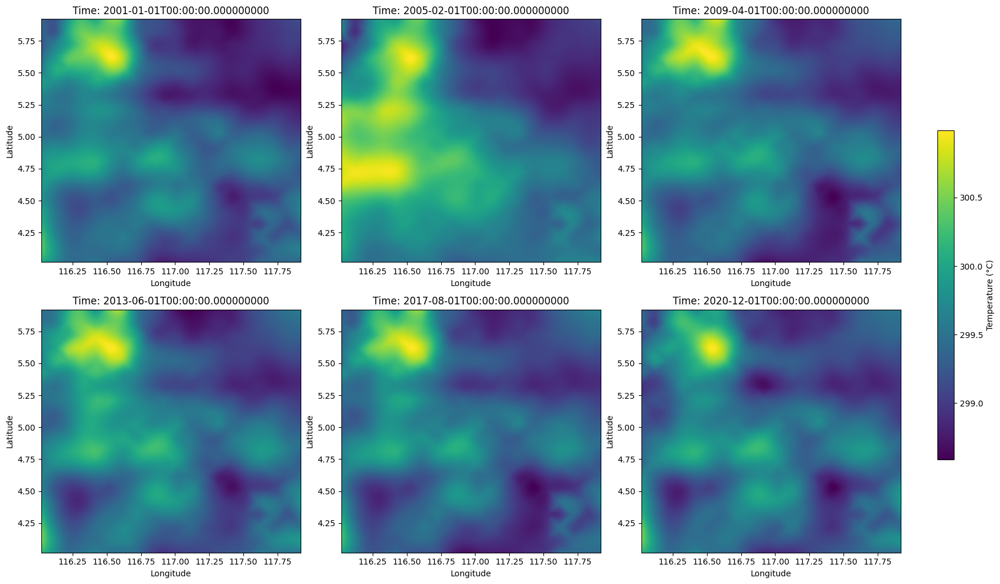

In [21]:
# Specified point in time
time_points = [1, 50, 100, 150, 200, 240]

fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(18, 10))

for ax, t in zip(axs.flatten(), time_points):
    data = highres_sealevel_temperature["t2m"].isel(time=t-1)  
    im = ax.pcolormesh(data.longitude, data.latitude, data, cmap='viridis', shading='auto')  

    ax.set_title(f'Time: {data.time.values}')
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')

fig.colorbar(im, ax=axs.ravel().tolist(), orientation='vertical', fraction=0.02, pad=0.05, label='Temperature (°C)')

plt.tight_layout()
plt.subplots_adjust(right=0.85) 
plt.show()

# Step3: Interpolate temperature to high resolution new elevation

In [501]:
# open GeoTIFF file
with rasterio.open('high_geopotential.tif') as src:
    # Read the first band for basic visualization
    band1 = src.read(1)
    
    # Collect file properties and transformation information
    data_type = band1.dtype
    file_width = src.width
    file_height = src.height
    num_bands = src.count
    crs = src.crs
    transform_info = src.transform
    max_value = np.nanmax(band1)
    min_value = np.nanmin(band1)

    print(f"max value: {max_value}")
    print(f"min value: {min_value}")



(data_type, file_width, file_height, num_bands, crs, transform_info)
#Each pixel represents approximately 0.00027778 degrees on the ground. 
#In a geographic coordinate system, this usually means that each pixel equals approximately 30.87 meters (depending on latitude).

max value: 2636
min value: -45


(dtype('int16'),
 6840,
 6840,
 1,
 CRS.from_epsg(4326),
 Affine(0.0002777777777778146, 0.0, 116.0198611111503,
        0.0, -0.0002777777777778146, 5.9201388888817235))

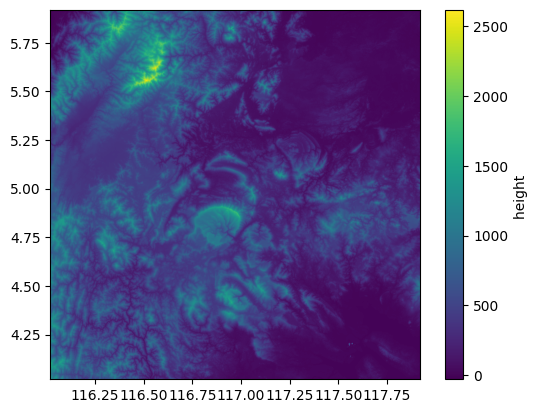

In [502]:
import rasterio
from rasterio.features import geometry_mask
from rasterio.warp import reproject, Resampling
from rasterio.plot import show
from shapely.geometry import box
import numpy as np

# Define the bounding box coordinates
min_lon = 116.02
min_lat = 4.02
max_lon = 117.92
max_lat = 5.92
bbox = box(min_lon, min_lat, max_lon, max_lat)

file_path = 'high_geopotential.tif'
clipped_file_path = 'clipped_geopotential.tif'
reprojected_file_path = 'reprojected_geopotential.tif'

# Open the original GeoTIFF file and clip it
with rasterio.open(file_path) as src:
    mask = geometry_mask([bbox], transform=src.transform, invert=True, out_shape=(src.height, src.width))
    out_image = src.read(1) * mask
    out_meta = src.meta.copy()
    out_meta.update({"driver": "GTiff", "height": out_image.shape[0], "width": out_image.shape[1], "transform": src.transform})

    # Save the clipped image to a new file
    with rasterio.open(clipped_file_path, 'w', **out_meta) as dest:
        dest.write(out_image, 1)

# Define the new resolution in degrees (assuming 100m resolution desired)
meters_per_degree = 111000
resolution_meters = 100
resolution_degrees = resolution_meters / meters_per_degree

# Reproject the clipped image to the new resolution
with rasterio.open(clipped_file_path) as src:
    original_image = src.read(1, masked=True)
    original_transform = src.transform
    new_width = int((max_lon - min_lon) / resolution_degrees)
    new_height = int((max_lat - min_lat) / resolution_degrees)
    affine_transform = rasterio.transform.from_origin(min_lon, max_lat, resolution_degrees, resolution_degrees)
    reprojected_image = np.zeros((new_height, new_width), dtype=original_image.dtype)

    reproject(original_image, reprojected_image,
              src_transform=original_transform,
              dst_transform=affine_transform,
              src_crs=src.crs,
              dst_crs=src.crs,
              resampling=Resampling.bilinear)

    reprojected_meta = src.meta.copy()
    reprojected_meta.update({"driver": "GTiff", "height": reprojected_image.shape[0], "width": reprojected_image.shape[1], "transform": affine_transform, "crs": src.crs})
    with rasterio.open(reprojected_file_path, 'w', **reprojected_meta) as dest:
        dest.write(reprojected_image, 1)
# Display the reprojected image
# Display the reprojected image with a colorbar
fig, ax = plt.subplots()  # 创建一个matplotlib的图形和轴
show(reprojected_image, transform=affine_transform, ax=ax)  # 使用rasterio的show函数显示图像
cbar = plt.colorbar(ax.images[0], ax=ax, orientation='vertical')  # 添加色标尺
cbar.set_label('height ')  # 设置色标尺的标签
plt.show()  # 显示图形


In [503]:
with rasterio.open(reprojected_file_path) as src:
    # 读取数据
    data = src.read(1)
    # 获取地理变换信息
    transform = src.transform

    # 创建经度和纬度坐标数组
    lons = np.linspace(transform.c, transform.c + transform.a * (src.width - 1), src.width)
    lats = np.linspace(transform.f, transform.f + transform.e * (src.height - 1), src.height)

    # 创建时间坐标
    time = pd.Timestamp('2020-01-01')

    # 创建xarray.DataArray
    data_array = xr.DataArray(
        data[np.newaxis, ...],  # 添加一个新的时间维度
        dims=("time", "latitude", "longitude"),
        coords={
            "time": [time],
            "latitude": lats,
            "longitude": lons
        },
        name="geopotential"
    )

    # 转换为xarray.Dataset
    high_res_geopotential = data_array.to_dataset()

# 显示数据集
high_res_geopotential

<xarray.Dataset> Size: 9MB
Dimensions:       (time: 1, latitude: 2109, longitude: 2109)
Coordinates:
  * time          (time) datetime64[ns] 8B 2020-01-01
  * latitude      (latitude) float64 17kB 5.92 5.919 5.918 ... 4.023 4.022 4.021
  * longitude     (longitude) float64 17kB 116.0 116.0 116.0 ... 117.9 117.9
Data variables:
    geopotential  (time, latitude, longitude) int16 9MB 0 0 0 0 0 ... 0 0 0 0 0

In [504]:
# Interpolate high_res_geopotential data onto a highres_sealevel_temperature latitude and longitude grid
high_res_geopotential= high_res_geopotential.interp(
    latitude=highres_sealevel_temperature['latitude'],
    longitude=highres_sealevel_temperature['longitude'],
    method='linear'  # Select the interpolation method, 'linear' is one of the commonly used interpolation methods
)
high_res_geopotential

<xarray.Dataset> Size: 36MB
Dimensions:       (time: 1, latitude: 2116, longitude: 2116)
Coordinates:
  * time          (time) datetime64[ns] 8B 2020-01-01
  * latitude      (latitude) float64 17kB 5.92 5.919 5.918 ... 4.022 4.021 4.02
  * longitude     (longitude) float64 17kB 116.0 116.0 116.0 ... 117.9 117.9
Data variables:
    geopotential  (time, latitude, longitude) float64 36MB nan nan ... nan nan

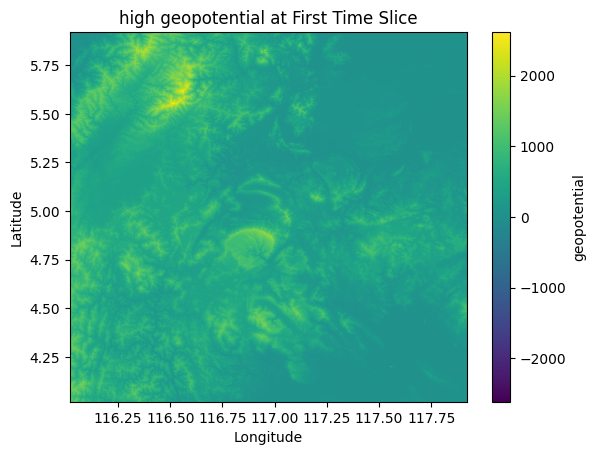

In [505]:
geopotential_slice = high_res_geopotential['geopotential'].isel(time=0)


# Use xarray's plotting function which handles the colorbar automatically
p = geopotential_slice.plot(cmap='viridis')  # 'p' is the mappable (image or contour set) returned by .plot()

# Enhance the plot with titles and labels
plt.title('high geopotential at First Time Slice')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

In [506]:
highres_sealevel_temperature

<xarray.Dataset> Size: 9GB
Dimensions:    (time: 240, latitude: 2116, longitude: 2116)
Coordinates:
  * time       (time) datetime64[ns] 2kB 2001-01-01 2001-02-01 ... 2020-12-01
  * latitude   (latitude) float64 17kB 5.92 5.919 5.918 ... 4.022 4.021 4.02
  * longitude  (longitude) float64 17kB 116.0 116.0 116.0 ... 117.9 117.9 117.9
Data variables:
    t2m        (time, latitude, longitude) float64 9GB 298.8 298.8 ... 299.4

In [507]:
# Calculate temperature as high resolution elevation
highres_temperature = highres_sealevel_temperature['t2m'].values + (high_res_geopotential['geopotential'].values * lapse_rate)

In [508]:
highres_temperature = xr.DataArray(
    highres_temperature,
    dims=['time','latitude','longitude',],
    coords={
        'time': highres_sealevel_temperature.time,
        'latitude': highres_sealevel_temperature.latitude,
        'longitude': highres_sealevel_temperature.longitude,
    }
)
highres_temperature

<xarray.DataArray (time: 240, latitude: 2116, longitude: 2116)> Size: 9GB
array([[[         nan,          nan,          nan, ...,          nan,
                  nan,          nan],
        [         nan, 298.8446138 , 298.84034321, ..., 298.58378374,
         298.56957575,          nan],
        [         nan, 298.84480367, 298.84053096, ..., 298.53680732,
         298.55911861,          nan],
        ...,
        [         nan, 290.67269177, 290.88537722, ..., 298.85565563,
         298.85603878,          nan],
        [         nan, 290.70075305, 290.89602388, ..., 298.85196968,
         298.85232752,          nan],
        [         nan,          nan,          nan, ...,          nan,
                  nan,          nan]],

       [[         nan,          nan,          nan, ...,          nan,
                  nan,          nan],
        [         nan, 298.94198895, 298.93659174, ..., 298.80837793,
         298.79424554,          nan],
        [         nan, 298.94242049, 298.9370226 , ..., 298.76065502,
         298.78304038,          nan],
...
        [         nan, 291.22373965, 291.4360145 , ..., 299.36273562,
         299.36341656,          nan],
        [         nan, 291.25209744, 291.44695924, ..., 299.35577276,
         299.35640879,          nan],
        [         nan,          nan,          nan, ...,          nan,
                  nan,          nan]],

       [[         nan,          nan,          nan, ...,          nan,
                  nan,          nan],
        [         nan, 299.4159155 , 299.41086313, ..., 299.51670265,
         299.50173424,          nan],
        [         nan, 299.41643072, 299.41137093, ..., 299.4697426 ,
         299.49129498,          nan],
        ...,
        [         nan, 291.23934795, 291.45131889, ..., 299.43111923,
         299.43160625,          nan],
        [         nan, 291.26761584, 291.46217348, ..., 299.42555423,
         299.42601186,          nan],
        [         nan,          nan,          nan, ...,          nan,
                  nan,          nan]]])
Coordinates:
  * time       (time) datetime64[ns] 2kB 2001-01-01 2001-02-01 ... 2020-12-01
  * latitude   (latitude) float64 17kB 5.92 5.919 5.918 ... 4.022 4.021 4.02
  * longitude  (longitude) float64 17kB 116.0 116.0 116.0 ... 117.9 117.9 117.9

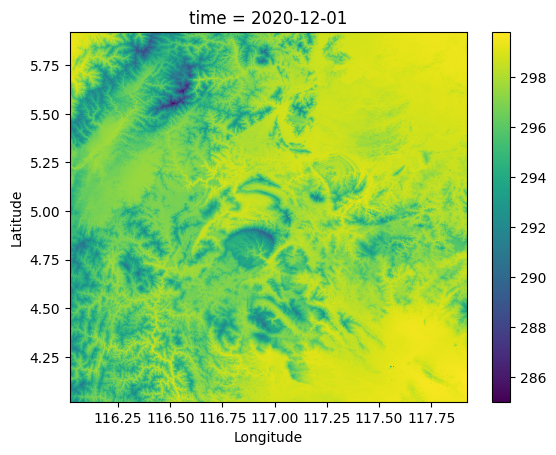

In [513]:
temperature_slice = highres_temperature.isel(time=239)

# Use xarray's plotting function which handles the colorbar automatically
p = temperature_slice.plot(cmap='viridis')  # 'p' is the mappable (image or contour set) returned by .plot()

# Enhance the plot with titles and labels
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()



/var/folders/vq/91h3xwfn35s185lcs4zf91x80000gn/T/ipykernel_67393/1458069081.py:16: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


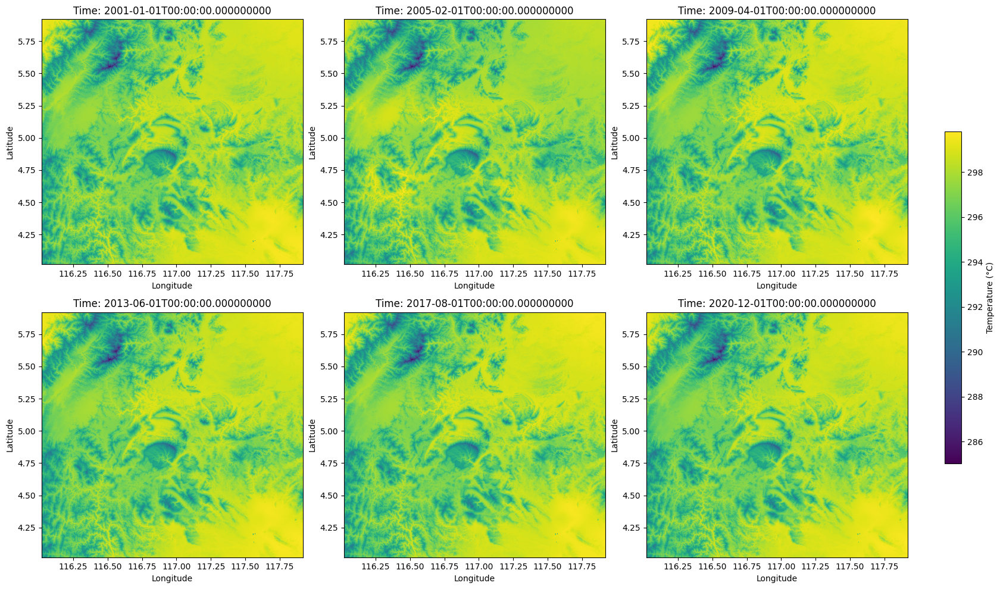

In [34]:
# Specified point in time
time_points = [1, 50, 100, 150, 200, 240]

fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(18, 10))

for ax, t in zip(axs.flatten(), time_points):
    data = highres_temperature.isel(time=t-1)  
    im = ax.pcolormesh(data.longitude, data.latitude, data, cmap='viridis', shading='auto')  

    ax.set_title(f'Time: {data.time.values}')
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')

fig.colorbar(im, ax=axs.ravel().tolist(), orientation='vertical', fraction=0.02, pad=0.05, label='Temperature (°C)')

plt.tight_layout()
plt.subplots_adjust(right=0.85) 
plt.show()

/var/folders/vq/91h3xwfn35s185lcs4zf91x80000gn/T/ipykernel_67393/3461322874.py:26: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


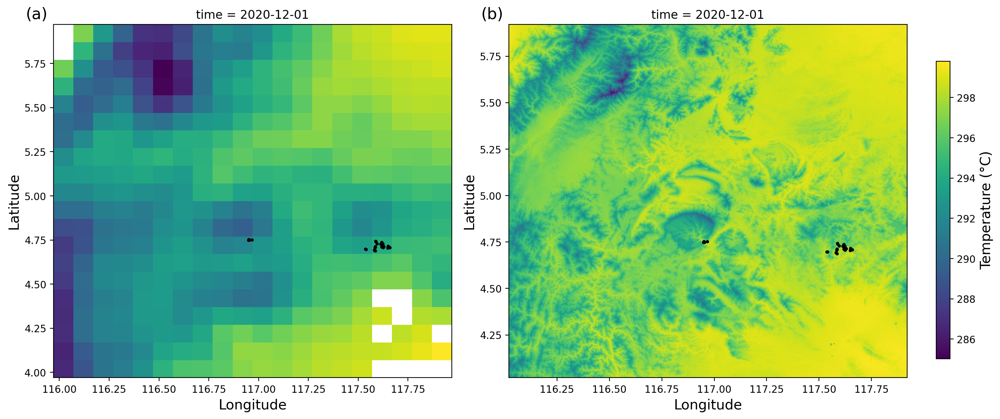

In [580]:
fig, axs = plt.subplots(1, 2, figsize=(13, 6), dpi=200) 

temperature_slice = lowres_temperature['t2m'].isel(time=239)
p = temperature_slice.plot(ax=axs[0], cmap='viridis', add_colorbar=False)  
axs[0].scatter(df['Longitude'], df['Latitude'], color='black', s=5, zorder=5)  
axs[0].set_xlabel('Longitude', fontsize=14) 
axs[0].set_ylabel('Latitude', fontsize=14)  
axs[0].text(-0.07, 1.05, '(a)', transform=axs[0].transAxes, fontsize=16, verticalalignment='top', color='black')


temperature_slice = highres_temperature.isel(time=239)
p = temperature_slice.plot(ax=axs[1], cmap='viridis', add_colorbar=False)  
axs[1].scatter(df['Longitude'], df['Latitude'], color='black', s=5, zorder=5)  
axs[1].set_xlabel('Longitude', fontsize=14) 
axs[1].set_ylabel('Latitude', fontsize=14)  
axs[1].text(-0.07, 1.05, '(b)', transform=axs[1].transAxes, fontsize=16, verticalalignment='top', color='black')

cbar_ax = fig.add_axes([1.02, 0.15, 0.015, 0.7])  # Adjust the position of the colorbar
fig.colorbar(p, cax=cbar_ax)
cbar_ax.set_ylabel('Temperature (°C)', fontsize=14)

plt.tight_layout()
plt.show()

# Step4: Load and clean measurement data

In [35]:
file_id = ['A_586', 'A_587', 'A_588', 'A_590', 'A_591', 'A_592', 'A_593', 'A_594', 'B_600', 'B_602', 'B_605', 'B_607', 'B_608', 'B_609', 'B_610', 'B_611', 'C_617', 'C_619', 'C_620', 'C_621', 'C_622', 'C_623', 'C_624', 'C_625', 'D_632', 'D_633', 'D_636', 'D_637', 'D_638', 'E_648', 'E_656', 'E_657', 'E_659', 'F_672', 'F_674', 'LFE_705', 'LFE_706', 'LFE_708', 'LFE_710', 'OG1_714', 'OG1_717', 'OG1_718', 'OG1_719', 'OG2_720', 'RP_5m_A0', 'RP_5m_B0']
def process_temperature_data(file_id, latitude, longitude):
    # Load temperature data from an Excel file
    file_path = f"{file_id}.xlsx"
    try:
        temp_data = pd.read_excel(file_path)
        temp_data['time'] = pd.to_datetime(temp_data['time'])
        temp_data.set_index('time', inplace=True)
        
        # Calculate monthly average temperature
        monthly_avg_temp = temp_data['Temp'].resample('M').mean()
        
        # Remove any months with NaN values
        monthly_avg_temp_clean = monthly_avg_temp.dropna()
        
        # Select the nearest temperature model data point
        nearest_model_temp = highres_temperature.sel(latitude=latitude, longitude=longitude, method="nearest")
        
        return monthly_avg_temp_clean, nearest_model_temp
    
    except Exception as e:
        return str(e)


In [37]:
location_data = pd.read_excel("/Users/yangcan/Desktop/master_project/data/latitude_longitude_data.xlsx")

results = {}  
    file_id = row['ID']
    latitude = row['Latitude']
    longitude = row['Longitude']
    
    measure, model = process_temperature_data(file_id, latitude, longitude)
    
    results[file_id] = {
        'Measure': measure,
        'Model': model
    }

/var/folders/vq/91h3xwfn35s185lcs4zf91x80000gn/T/ipykernel_67393/1450497330.py:11: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_avg_temp = temp_data['Temp'].resample('M').mean()
/var/folders/vq/91h3xwfn35s185lcs4zf91x80000gn/T/ipykernel_67393/1450497330.py:11: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_avg_temp = temp_data['Temp'].resample('M').mean()
/var/folders/vq/91h3xwfn35s185lcs4zf91x80000gn/T/ipykernel_67393/1450497330.py:11: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_avg_temp = temp_data['Temp'].resample('M').mean()
/var/folders/vq/91h3xwfn35s185lcs4zf91x80000gn/T/ipykernel_67393/1450497330.py:11: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_avg_temp = temp_data['Temp'].resample('M').mean()
/var/folders/vq/91h3xwfn35s185lc

In [41]:
for file_id in results:
    
    globals()[f"{file_id}_model"] = results[file_id]['Model']
    globals()[f"{file_id}_measure"] = results[file_id]['Measure']

In [42]:
#A_586
time_ranges = [
    slice("2013-05-01", "2015-10-31"),
    slice("2018-11-01", "2018-11-30"),
    slice("2018-12-01", "2018-12-31"),
    slice("2019-01-01", "2019-01-31")
]

selected_data = xr.concat(
    [A_586_model.sel(time=tr) for tr in time_ranges],
    dim='time'
)

A_586_model = selected_data - 273.15
A_586_model

<xarray.DataArray (time: 33)> Size: 264B
array([24.04058728, 24.28550428, 23.48615139, 23.45549663, 23.89094636,
       23.80517919, 23.23233694, 23.53669533, 22.67233398, 23.23053944,
       24.07663225, 24.34090777, 24.23221444, 24.32628031, 24.07001703,
       23.42311364, 23.71605297, 23.9830672 , 23.57383365, 23.56800735,
       23.10652812, 23.464151  , 23.94891966, 24.29239575, 24.33984744,
       24.12445622, 24.16224736, 24.02783916, 24.0684577 , 24.08347281,
       23.82981161, 23.81846615, 23.52366747])
Coordinates:
  * time       (time) datetime64[ns] 264B 2013-05-01 2013-06-01 ... 2019-01-01
    latitude   float64 8B 4.708
    longitude  float64 8B 117.7

In [43]:
#A_587
time_ranges = [
    slice("2013-05-01", "2015-10-31"),
    slice("2018-11-01", "2018-11-30"),
    slice("2018-12-01", "2018-12-31"),
    slice("2019-01-01", "2019-01-31")
]
selected_data = xr.concat(
    [A_587_model.sel(time=tr) for tr in time_ranges],
    dim='time'
)
A_587_model = selected_data - 273.15

In [44]:
#A_588
time_ranges = [
    slice("2013-05-01", "2015-10-31"),
    slice("2018-11-01", "2018-11-30"),
    slice("2018-12-01", "2018-12-31"),
    slice("2019-01-01", "2019-01-31")
]
selected_data = xr.concat(
    [A_588_model.sel(time=tr) for tr in time_ranges],
    dim='time'
)
A_588_model = selected_data - 273.15

In [45]:
#A_590
time_ranges = [
    slice("2013-05-01", "2015-10-31"),
    slice("2018-11-01", "2018-11-30"),
    slice("2018-12-01", "2018-12-31"),
    slice("2019-01-01", "2019-01-31")
]
selected_data = xr.concat(
    [A_590_model.sel(time=tr) for tr in time_ranges],
    dim='time'
)
A_590_model = selected_data - 273.15

In [46]:
#A_591
time_ranges = [
    slice("2013-05-01", "2013-08-31"),
    slice("2014-05-01", "2014-07-31"),
    slice("2015-02-01", "2015-03-31"),
    slice("2018-11-01", "2019-01-31")
]
selected_data = xr.concat(
    [A_591_model.sel(time=tr) for tr in time_ranges],
    dim='time'
)
A_591_model = selected_data - 273.15

In [47]:
#A_592
time_ranges = [
    slice("2013-05-01", "2014-02-28"),
    slice("2014-05-01", "2014-06-30"),
    slice("2015-02-01", "2015-03-31"),
    slice("2016-08-01", "2016-09-30"),
    slice("2018-11-01", "2019-01-31")
]
selected_data = xr.concat(
    [A_592_model.sel(time=tr) for tr in time_ranges],
    dim='time'
)
A_592_model = selected_data - 273.15


In [48]:
#A_593
time_ranges = [
    slice("2013-05-01", "2015-11-30"),
    slice("2018-11-01", "2019-01-31")
]
selected_data = xr.concat(
    [A_593_model.sel(time=tr) for tr in time_ranges],
    dim='time'
)
A_593_model = selected_data - 273.15

In [49]:
#A_594
time_ranges = [
    slice("2013-05-01", "2015-07-31")
]
selected_data = xr.concat(
    [A_594_model.sel(time=tr) for tr in time_ranges],
    dim='time'
)
A_594_model = selected_data - 273.15

In [50]:
#B_600
time_ranges = [
    slice("2014-04-01", "2015-10-31")
]
selected_data = xr.concat(
    [B_600_model.sel(time=tr) for tr in time_ranges],
    dim='time'
)
B_600_model = selected_data - 273.15

In [51]:
#B_602
time_ranges = [
    slice("2014-04-01", "2015-10-31")
]
selected_data = xr.concat(
    [B_602_model.sel(time=tr) for tr in time_ranges],
    dim='time'
)
B_602_model = selected_data - 273.15

In [52]:
#B_605
time_ranges = [
    slice("2014-05-01", "2015-06-30"),
    slice("2018-02-01", "2019-09-30")
]
selected_data = xr.concat(
    [B_605_model.sel(time=tr) for tr in time_ranges],
    dim='time'
)
B_605_model = selected_data - 273.15

In [53]:
#B_607
time_ranges = [
    slice("2014-05-01", "2015-10-31"),
    slice("2016-08-01", "2017-05-31"),
    slice("2018-02-01", "2018-02-28")
]
selected_data = xr.concat(
    [B_607_model.sel(time=tr) for tr in time_ranges],
    dim='time'
)
B_607_model = selected_data - 273.15

In [54]:
#B_608
time_ranges = [
    slice("2014-04-01", "2015-10-31")
]
selected_data = xr.concat(
    [B_608_model.sel(time=tr) for tr in time_ranges],
    dim='time'
)
B_608_model = selected_data - 273.15

In [55]:
#B_609
time_ranges = [
    slice("2014-04-01", "2015-01-31")
]
selected_data = xr.concat(
    [B_609_model.sel(time=tr) for tr in time_ranges],
    dim='time'
)
B_609_model = selected_data - 273.15

In [56]:
#B_610
time_ranges = [
    slice("2014-04-01", "2015-10-31")
]
selected_data = xr.concat(
    [B_610_model.sel(time=tr) for tr in time_ranges],
    dim='time'
)
B_610_model = selected_data - 273.15

In [57]:
#B_611
time_ranges = [
    slice("2014-04-01", "2014-05-31")
]
selected_data = xr.concat(
    [B_611_model.sel(time=tr) for tr in time_ranges],
    dim='time'
)
B_611_model = selected_data - 273.15

In [58]:
#C_617    
time_ranges = [
    slice("2013-05-01", "2013-07-31"),
    slice("2014-02-01", "2014-04-30"),
    slice("2015-01-01", "2015-02-28"),
]
selected_data = xr.concat(
    [C_617_model.sel(time=tr) for tr in time_ranges],
    dim='time'
)
C_617_model = selected_data - 273.15

In [59]:
#C_619      
time_ranges = [
    slice("2013-05-01", "2014-11-30"),
    slice("2015-03-01", "2015-08-31"),
    slice("2016-08-01", "2017-04-30")
]
selected_data = xr.concat(
    [C_619_model.sel(time=tr) for tr in time_ranges],
    dim='time'
)
C_619_model = selected_data - 273.15

In [60]:
#C_620  
time_ranges = [
    slice("2013-05-01", "2013-06-30"),
    slice("2014-02-01", "2014-04-30"),
    slice("2015-01-01", "2015-03-31"),
    slice("2016-08-01", "2016-08-31")
]
selected_data = xr.concat(
    [C_620_model.sel(time=tr) for tr in time_ranges],
    dim='time'
)
C_620_model = selected_data - 273.15

In [61]:
#C_621
time_ranges = [
    slice("2013-05-01", "2013-12-31"),
    slice("2014-02-01", "2014-03-31"),
]
selected_data = xr.concat(
    [C_621_model.sel(time=tr) for tr in time_ranges],
    dim='time'
)
C_621_model = selected_data - 273.15

In [62]:
#C_622
time_ranges = [
    slice("2013-05-01", "2014-06-30"),
    slice("2015-01-01", "2015-01-31")
]
selected_data = xr.concat(
    [C_622_model.sel(time=tr) for tr in time_ranges],
    dim='time'
)
C_622_model = selected_data - 273.15

In [63]:
#C_623
time_ranges = [
    slice("2013-05-01", "2015-01-31"),
]
selected_data = xr.concat(
    [C_623_model.sel(time=tr) for tr in time_ranges],
    dim='time'
)
C_623_model = selected_data - 273.15

In [64]:
#C_624
time_ranges = [
    slice("2013-05-01", "2015-11-30"),
]
selected_data = xr.concat(
    [C_624_model.sel(time=tr) for tr in time_ranges],
    dim='time'
)
C_624_model = selected_data - 273.15

In [65]:
#C_625
time_ranges = [
    slice("2013-05-01", "2015-11-30"),
]
selected_data = xr.concat(
    [C_625_model.sel(time=tr) for tr in time_ranges],
    dim='time'
)
C_625_model = selected_data - 273.15

In [66]:
#D_632
time_ranges = [
    slice("2013-05-01", "2014-11-30"),
    slice("2015-01-01", "2015-11-30"),
]
selected_data = xr.concat(
    [D_632_model.sel(time=tr) for tr in time_ranges],
    dim='time'
)
D_632_model = selected_data - 273.15

In [67]:
#D_633
time_ranges = [
    slice("2013-05-01", "2013-10-31"),
    slice("2014-02-01", "2014-04-30"),
    slice("2015-01-01", "2015-02-28"),
]
selected_data = xr.concat(
    [D_633_model.sel(time=tr) for tr in time_ranges],
    dim='time'
)
D_633_model = selected_data - 273.15

In [68]:
#D_636
time_ranges = [
    slice("2013-05-01", "2013-08-31"),
    slice("2014-02-01", "2014-05-31"),
    slice("2015-01-01", "2015-04-30"),
    slice("2016-08-01", "2016-09-30")
]
selected_data = xr.concat(
    [D_636_model.sel(time=tr) for tr in time_ranges],
    dim='time'
)
D_636_model = selected_data - 273.15

In [69]:
#D_637
time_ranges = [
    slice("2013-05-01", "2013-11-30"),
    slice("2014-02-01", "2014-09-30"),
    slice("2015-01-01", "2015-02-28"),
    slice("2016-08-01", "2016-09-30")
]
selected_data = xr.concat(
    [D_637_model.sel(time=tr) for tr in time_ranges],
    dim='time'
)
D_637_model = selected_data - 273.15

In [70]:
#D_638
time_ranges = [
    slice("2013-05-01", "2014-11-30"),
    slice("2015-01-01", "2015-11-30"),
    slice("2016-08-01", "2017-01-31")
]
selected_data = xr.concat(
    [D_638_model.sel(time=tr) for tr in time_ranges],
    dim='time'
)
D_638_model = selected_data - 273.15

In [71]:
#E_648
time_ranges = [
    slice("2013-11-01", "2015-01-31"),
    slice("2016-09-01", "2017-04-30"),
    slice("2019-01-01", "2019-03-31")
]
selected_data = xr.concat(
    [E_648_model.sel(time=tr) for tr in time_ranges],
    dim='time'
)
E_648_model = selected_data - 273.15

In [72]:
#E_656
time_ranges = [
    slice("2013-11-01", "2014-02-28"),
    slice("2016-09-01", "2017-04-30")
]
selected_data = xr.concat(
    [E_656_model.sel(time=tr) for tr in time_ranges],
    dim='time'
)
E_656_model = selected_data - 273.15

In [73]:
#E_657
time_ranges = [
    slice("2013-11-01", "2014-05-31"),
    slice("2015-01-01", "2015-11-30"),
    slice("2016-09-01", "2017-04-30"),
    slice("2018-02-01", "2019-03-31")
]
selected_data = xr.concat(
    [E_657_model.sel(time=tr) for tr in time_ranges],
    dim='time'
)
E_657_model = selected_data - 273.15

In [74]:
#E_659
time_ranges = [
    slice("2013-11-01", "2014-05-31"),
    slice("2015-01-01", "2015-11-30"),
    slice("2016-09-01", "2017-04-30"),
    slice("2019-01-01", "2019-03-31")
]
selected_data = xr.concat(
    [E_659_model.sel(time=tr) for tr in time_ranges],
    dim='time'
)
E_659_model = selected_data - 273.15

In [75]:
#F_672
time_ranges = [
    slice("2013-05-01", "2018-09-30")
]
selected_data = xr.concat(
    [F_672_model.sel(time=tr) for tr in time_ranges],
    dim='time'
)
F_672_model = selected_data - 273.15

In [76]:
#F_674
time_ranges = [
    slice("2013-05-01", "2015-01-31"),
    slice("2016-04-01", "2017-08-31"),
    slice("2018-07-01", "2018-09-30")
]
selected_data = xr.concat(
    [F_674_model.sel(time=tr) for tr in time_ranges],
    dim='time'
)
F_674_model = selected_data - 273.15

In [77]:
#LFE_705
time_ranges = [
    slice("2015-01-01", "2015-11-30"),
    slice("2016-08-01", "2017-01-31"),
    slice("2018-02-01", "2018-09-30")
]
selected_data = xr.concat(
    [LFE_705_model.sel(time=tr) for tr in time_ranges],
    dim='time'
)
LFE_705_model = selected_data - 273.15

In [78]:
#LFE_706
time_ranges = [
    slice("2013-06-01", "2015-11-30"),
    slice("2016-08-01", "2017-01-31"),
    slice("2018-02-01", "2018-09-30")
]
selected_data = xr.concat(
    [LFE_706_model.sel(time=tr) for tr in time_ranges],
    dim='time'
)
LFE_706_model = selected_data - 273.15

In [79]:
#LFE_708
time_ranges = [
    slice("2013-06-01", "2015-01-31"),
    slice("2016-08-01", "2017-01-31"),
    slice("2018-02-01", "2018-09-30")
]
selected_data = xr.concat(
    [LFE_708_model.sel(time=tr) for tr in time_ranges],
    dim='time'
)
LFE_708_model = selected_data - 273.15

In [80]:
#LFE_710
time_ranges = [
    slice("2013-06-01", "2014-09-30"),
    slice("2015-01-01", "2015-11-30"),
    slice("2016-08-01", "2017-01-31"),
    slice("2018-02-01", "2018-09-30")
]
selected_data = xr.concat(
    [LFE_710_model.sel(time=tr) for tr in time_ranges],
    dim='time'
)
LFE_710_model = selected_data - 273.15

In [81]:
#OG1_714
time_ranges = [
    slice("2013-07-01", "2017-02-28")
]
selected_data = xr.concat(
    [OG1_714_model.sel(time=tr) for tr in time_ranges],
    dim='time'
)
OG1_714_model = selected_data - 273.15

In [82]:
#OG1_717
time_ranges = [
    slice("2013-11-01", "2014-11-30"),
    slice("2015-01-01", "2017-02-28"),
]
selected_data = xr.concat(
    [OG1_717_model.sel(time=tr) for tr in time_ranges],
    dim='time'
)
OG1_717_model = selected_data - 273.15

In [83]:
#OG1_718
time_ranges = [
    slice("2013-07-01", "2017-02-28")
]
selected_data = xr.concat(
    [OG1_718_model.sel(time=tr) for tr in time_ranges],
    dim='time'
)
OG1_718_model = selected_data - 273.15

In [84]:
#OG1_719
time_ranges = [
    slice("2013-11-01", "2014-09-30"),
    slice("2015-01-01", "2015-04-30"),
    slice("2015-12-01", "2015-12-31")
]
selected_data = xr.concat(
    [OG1_719_model.sel(time=tr) for tr in time_ranges],
    dim='time'
)
OG1_719_model = selected_data - 273.15

In [85]:
#OG2_720
time_ranges = [
    slice("2013-07-01", "2015-12-31"),
    slice("2016-12-01", "2017-03-31")
]
selected_data = xr.concat(
    [OG2_720_model.sel(time=tr) for tr in time_ranges],
    dim='time'
)
OG2_720_model = selected_data - 273.15

In [86]:
#RP_5m_A0
time_ranges = [
    slice("2013-06-01", "2017-03-31")
]
selected_data = xr.concat(
    [RP_5m_A0_model.sel(time=tr) for tr in time_ranges],
    dim='time'
)
RP_5m_A0_model = selected_data - 273.15

In [87]:
#RP_5m_B0
time_ranges = [
    slice("2013-06-01", "2017-03-31")
]
selected_data = xr.concat(
    [RP_5m_B0_model.sel(time=tr) for tr in time_ranges],
    dim='time'
)
RP_5m_B0_model = selected_data - 273.15

In [88]:
model = {'A_586_model': A_586_model,'A_587_model': A_587_model,"A_587_model": A_587_model,"A_588_model": A_588_model,"A_590_model": A_590_model,"A_591_model": A_591_model,"A_592_model": A_592_model,"A_593_model": A_593_model,"A_594_model": A_594_model,"B_600_model": B_600_model,"B_602_model": B_602_model,"B_605_model": B_605_model,"B_607_model": B_607_model,"B_608_model": B_608_model,"B_609_model": B_609_model,"B_610_model": B_610_model,"B_611_model": B_611_model,"C_617_model": C_617_model,"C_619_model": C_619_model,"C_620_model": C_620_model,"C_621_model": C_621_model,"C_622_model": C_622_model,"C_623_model": C_623_model,"C_624_model": C_624_model,"C_625_model": C_625_model,"D_632_model": D_632_model,"D_633_model": D_633_model,"D_636_model": D_636_model,"D_637_model": D_637_model,"D_638_model": D_638_model,"E_648_model": E_648_model,"E_656_model": E_656_model,"E_657_model": E_657_model,"E_659_model": E_659_model,"F_672_model": F_672_model,"F_674_model": F_674_model,"LFE_705_model": LFE_705_model,"LFE_706_model": LFE_706_model,"LFE_708_model": LFE_708_model,"LFE_710_model": LFE_710_model,"OG1_714_model": OG1_714_model,"OG1_717_model": OG1_717_model,"OG1_718_model": OG1_718_model,"OG1_719_model": OG1_719_model,"OG2_720_model": OG2_720_model,"RP_5m_A0_model": RP_5m_A0_model,"RP_5m_B0_model": RP_5m_B0_model}
measure = {"A_586_measure": A_586_measure,"A_587_measure": A_587_measure,"A_587_measure": A_587_measure,"A_588_measure": A_588_measure,"A_590_measure": A_590_measure,"A_591_measure": A_591_measure,"A_592_measure": A_592_measure,"A_593_measure": A_593_measure,"A_594_measure": A_594_measure,"B_600_measure": B_600_measure,"B_602_measure": B_602_measure,"B_605_measure": B_605_measure,"B_607_measure": B_607_measure,"B_608_measure": B_608_measure,"B_609_measure": B_609_measure,"B_610_measure": B_610_measure,"B_611_measure": B_611_measure,"C_617_measure": C_617_measure,"C_619_measure": C_619_measure,"C_620_measure": C_620_measure,"C_621_measure": C_621_measure,"C_622_measure": C_622_measure,"C_623_measure": C_623_measure,"C_624_measure": C_624_measure,"C_625_measure": C_625_measure,"D_632_measure": D_632_measure,"D_633_measure": D_633_measure,"D_636_measure": D_636_measure,"D_637_measure": D_637_measure,"D_638_measure": D_638_measure,"E_648_measure": E_648_measure,"E_656_measure": E_656_measure,"E_657_measure": E_657_measure,"E_659_measure": E_659_measure,"F_672_measure": F_672_measure,"F_674_measure": F_674_measure,"LFE_705_measure": LFE_705_measure,"LFE_706_measure": LFE_706_measure,"LFE_708_measure": LFE_708_measure,"LFE_710_measure": LFE_710_measure,"OG1_714_measure": OG1_714_measure,"OG1_717_measure": OG1_717_measure,"OG1_718_measure": OG1_718_measure,"OG1_719_measure": OG1_719_measure,"OG2_720_measure": OG2_720_measure,"RP_5m_A0_measure": RP_5m_A0_measure,"RP_5m_B0_measure": RP_5m_B0_measure}

In [89]:
lat_lon_list = []

for model_name, model_data in model.items():
    lat_vals = model_data['latitude'].values.flatten()
    lon_vals = model_data['longitude'].values.flatten()
    lat_lon_pairs = zip(lat_vals, lon_vals)
    lat_lon_list.extend(lat_lon_pairs)

lat_lon_df = pd.DataFrame(lat_lon_list, columns=['Latitude', 'Longitude'])

lat_lon_df
lat_lon_df.to_csv('0.1km_lon_lat.csv', index=False)


In [90]:
for key in model:
    temp_df = model[key].to_dataframe(name='value')
    
    temp_df.index = temp_df.index.get_level_values('time').strftime('%Y-%m')
    
    globals()[key] = temp_df
for key in measure:
    temp_df = measure[key].to_frame(name='value')
    
    temp_df.index = temp_df.index.strftime('%Y-%m')
    
    globals()[key] = temp_df


In [91]:
def prepare_model_data(model_dict):
    new_model_dict = {}
    for key, data in model_dict.items():
        temp_df = data.to_dataframe(name='value')
        temp_df.index = temp_df.index.get_level_values('time').strftime('%Y-%m')
        new_model_dict[key] = temp_df
    return new_model_dict
def prepare_measure_data(measure_dict):
    new_measure_dict = {}
    for key, data in measure_dict.items():
        temp_df = data.to_frame(name='value')
        temp_df.index = temp_df.index.strftime('%Y-%m')
        new_measure_dict[key] = temp_df
    return new_measure_dict

new_model = prepare_model_data(model)
new_measure = prepare_measure_data(measure)

# Step5: Compare the downscaled temperature data with measured microclimate data

In [383]:
cor_A_586 = A_586_model['value'].corr(A_586_measure['value'])
cor_A_587 = A_587_model['value'].corr(A_587_measure['value'])
cor_A_588 = A_588_model['value'].corr(A_588_measure['value'])
cor_A_590 = A_590_model['value'].corr(A_590_measure['value'])
cor_A_591 = A_591_model['value'].corr(A_591_measure['value'])
cor_A_592 = A_592_model['value'].corr(A_592_measure['value'])
cor_A_593 = A_593_model['value'].corr(A_593_measure['value'])
cor_A_594 = A_594_model['value'].corr(A_594_measure['value'])
cor_B_600 = B_600_model['value'].corr(B_600_measure['value'])
cor_B_602 = B_602_model['value'].corr(B_602_measure['value'])
cor_B_605 = B_605_model['value'].corr(B_605_measure['value'])
cor_B_607 = B_607_model['value'].corr(B_607_measure['value'])
cor_B_608 = B_608_model['value'].corr(B_608_measure['value'])
cor_B_609 = B_609_model['value'].corr(B_609_measure['value'])
cor_B_610 = B_610_model['value'].corr(B_610_measure['value'])
cor_B_611 = B_611_model['value'].corr(B_611_measure['value'])
cor_C_617 = C_617_model['value'].corr(C_617_measure['value'])
cor_C_619 = C_619_model['value'].corr(C_619_measure['value'])
cor_C_620 = C_620_model['value'].corr(C_620_measure['value'])
cor_C_621 = C_621_model['value'].corr(C_621_measure['value'])
cor_C_622 = C_622_model['value'].corr(C_622_measure['value'])
cor_C_623 = C_623_model['value'].corr(C_623_measure['value'])
cor_C_624 = C_624_model['value'].corr(C_624_measure['value'])
cor_C_625 = C_625_model['value'].corr(C_625_measure['value'])
cor_D_632 = D_632_model['value'].corr(D_632_measure['value'])
cor_D_633 = D_633_model['value'].corr(D_633_measure['value'])
cor_D_636 = D_636_model['value'].corr(D_636_measure['value'])
cor_D_637 = D_637_model['value'].corr(D_637_measure['value'])
cor_D_638 = D_638_model['value'].corr(D_638_measure['value'])
cor_E_648 = E_648_model['value'].corr(E_648_measure['value'])
cor_E_656 = E_656_model['value'].corr(E_656_measure['value'])
cor_E_657 = E_657_model['value'].corr(E_657_measure['value'])
cor_E_659 = E_659_model['value'].corr(E_659_measure['value'])
cor_F_672 = F_672_model['value'].corr(F_672_measure['value'])
cor_F_674 = F_674_model['value'].corr(F_674_measure['value'])
cor_LFE_705 = LFE_705_model['value'].corr(LFE_705_measure['value'])
cor_LFE_706 = LFE_706_model['value'].corr(LFE_706_measure['value'])
cor_LFE_708 = LFE_708_model['value'].corr(LFE_708_measure['value'])
cor_LFE_710 = LFE_710_model['value'].corr(LFE_710_measure['value'])
cor_OG1_714 = OG1_714_model['value'].corr(OG1_714_measure['value'])
cor_OG1_717 = OG1_717_model['value'].corr(OG1_717_measure['value'])
cor_OG1_718 = OG1_718_model['value'].corr(OG1_718_measure['value'])
cor_OG1_719 = OG1_719_model['value'].corr(OG1_719_measure['value'])
cor_OG2_720 = OG2_720_model['value'].corr(OG2_720_measure['value'])
cor_RP_5m_A0 = RP_5m_A0_model['value'].corr(RP_5m_A0_measure['value'])
cor_RP_5m_B0 = RP_5m_B0_model['value'].corr(RP_5m_B0_measure['value'])


In [384]:
correlations = {
    'A_586': cor_A_586, 'A_587': cor_A_587, 'A_588': cor_A_588, 'A_590': cor_A_590, 'A_591': cor_A_591, 'A_592': cor_A_592, 'A_593': cor_A_593, 'A_594': cor_A_594, 'B_600': cor_B_600, 'B_602': cor_B_602, 'B_605': cor_B_605, 'B_607': cor_B_607, 'B_608': cor_B_608, 'B_609': cor_B_609, 'B_610': cor_B_610, 'B_611': cor_B_611, 'C_617': cor_C_617, 'C_619': cor_C_619, 'C_620': cor_C_620, 'C_621': cor_C_621, 'C_622': cor_C_622, 'C_623': cor_C_623, 'C_624': cor_C_624, 'C_625': cor_C_625, 'D_632': cor_D_632, 'D_633': cor_D_633, 'D_636': cor_D_636, 'D_637': cor_D_637, 'D_638': cor_D_638, 'E_648': cor_E_648, 'E_656': cor_E_656, 'E_657': cor_E_657, 'E_659': cor_E_659, 'F_672': cor_F_672, 'F_674': cor_F_674, 'LFE_705': cor_LFE_705, 'LFE_706': cor_LFE_706, 'LFE_708': cor_LFE_708, 'LFE_710': cor_LFE_710, 'OG1_714': cor_OG1_714, 'OG1_717': cor_OG1_717, 'OG1_718': cor_OG1_718, 'OG1_719': cor_OG1_719, 'OG2_720': cor_OG2_720, 'RP_5m_A0': cor_RP_5m_A0, 'RP_5m_B0': cor_RP_5m_B0
}

In [385]:
correlation_df = pd.DataFrame(list(correlations.items()), columns=['ID', 'Correlation'])

correlation_df.to_excel("correlation_results.xlsx", index=False)

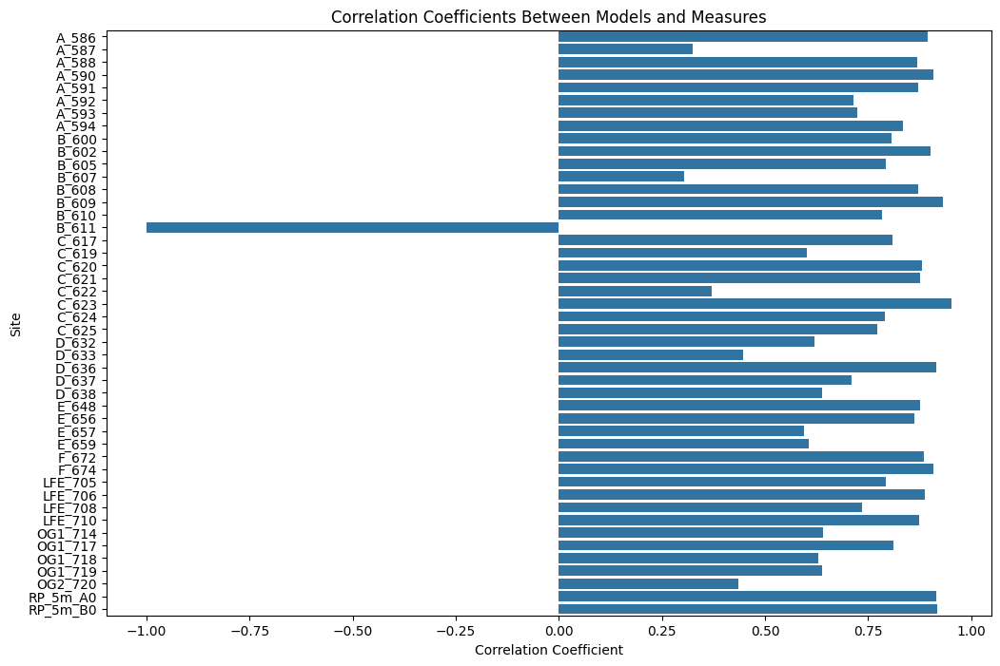

In [386]:
correlation = pd.read_excel('correlation_results.xlsx')

plt.figure(figsize=(12, 8))

sns.barplot(x='Correlation', y='ID', data=correlation)

plt.title('Correlation Coefficients Between Models and Measures')
plt.xlabel('Correlation Coefficient')
plt.ylabel('Site')

plt.show()

In [387]:
def polyfit(df_model, df_measure):
    z = np.polyfit(df_model['value'], df_measure['value'], 1)
    p = np.poly1d(z)
    y = p(df_model['value'])
    return p,y


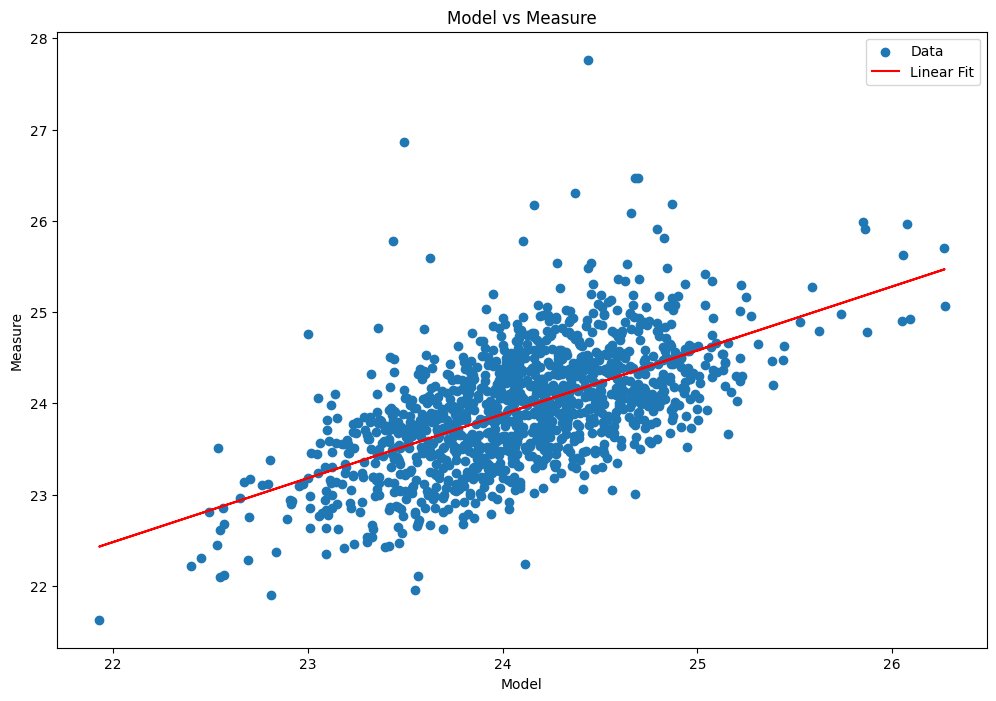

In [388]:
# Concatenate measure dataframes vertically
measure_whole = pd.concat([A_586_measure, A_587_measure, A_588_measure, A_590_measure, A_591_measure, A_592_measure, A_593_measure, A_594_measure, B_600_measure, B_602_measure, B_605_measure, B_607_measure, B_608_measure, B_609_measure, B_610_measure, B_611_measure, C_617_measure, C_619_measure, C_620_measure, C_621_measure, C_622_measure, C_623_measure, C_624_measure, C_625_measure, D_632_measure, D_633_measure, D_636_measure, D_637_measure, D_638_measure, E_648_measure, E_656_measure, E_657_measure, E_659_measure, F_672_measure, F_674_measure, LFE_705_measure, LFE_706_measure, LFE_708_measure, LFE_710_measure, OG1_714_measure, OG1_717_measure, OG1_718_measure, OG1_719_measure, OG2_720_measure, RP_5m_A0_measure, RP_5m_B0_measure], axis=0)

# Concatenate model dataframes vertically
model_whole = pd.concat([A_586_model, A_587_model, A_588_model, A_590_model, A_591_model, A_592_model, A_593_model, A_594_model, B_600_model, B_602_model, B_605_model, B_607_model, B_608_model, B_609_model, B_610_model, B_611_model, C_617_model, C_619_model, C_620_model, C_621_model, C_622_model, C_623_model, C_624_model, C_625_model, D_632_model, D_633_model, D_636_model, D_637_model, D_638_model, E_648_model, E_656_model, E_657_model, E_659_model, F_672_model, F_674_model, LFE_705_model, LFE_706_model, LFE_708_model, LFE_710_model, OG1_714_model, OG1_717_model, OG1_718_model, OG1_719_model, OG2_720_model, RP_5m_A0_model, RP_5m_B0_model], axis=0)

# Sort measure dataframe by index
measure_whole = measure_whole.sort_index()

# Sort model dataframe by index
model_whole = model_whole.sort_index()

# Extract 'value' column from measure dataframe
measure_values = measure_whole['value']

# Extract 'value' column from model dataframe
model_values = model_whole['value']


# Plot the data
plt.figure(figsize=(12, 8))
plt.scatter(model_values, measure_values, label='Data')
plt.plot(model_values, polyfit(model_whole, measure_whole)[1], color='r', label='Linear Fit')
plt.xlabel('Model')
plt.ylabel('Measure')
plt.title('Model vs Measure')
plt.legend()
plt.show()


In [389]:
polyfit(model_whole, measure_whole)

(poly1d([0.69970061, 7.08716308]),
 array([23.90837671, 24.32014147, 24.22091041, ..., 24.19830308,
        24.54709398, 24.72214637]))

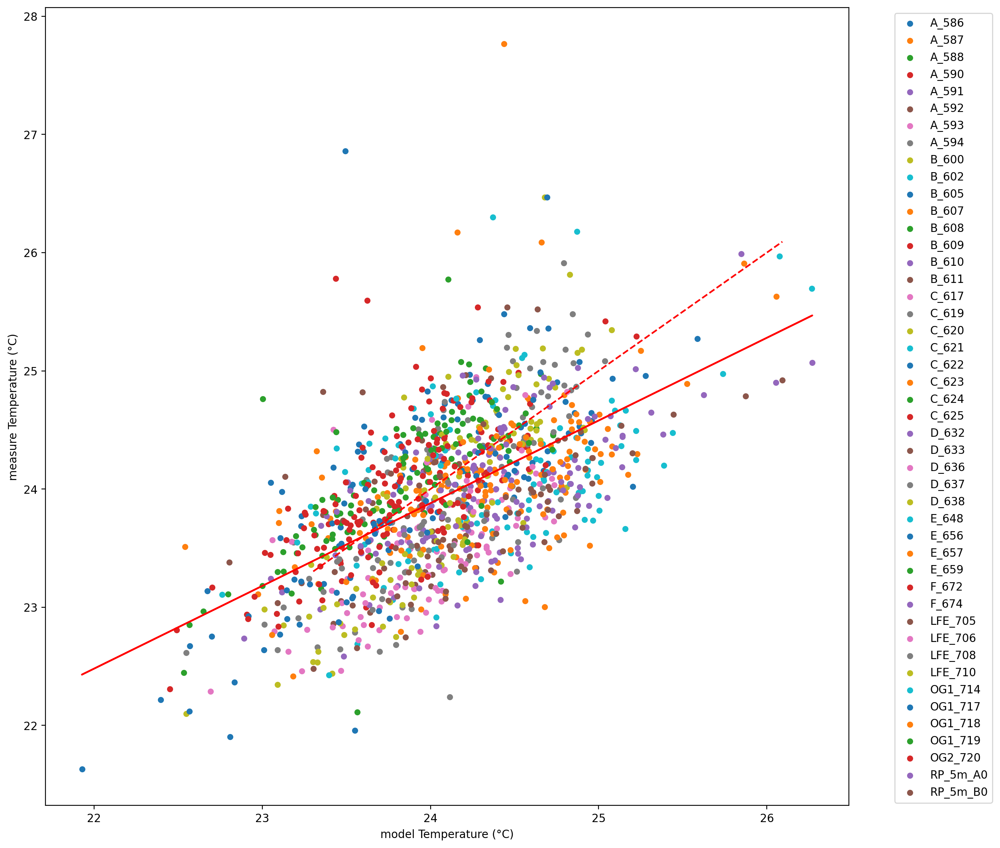

In [390]:
plt.figure(figsize=(13,13),dpi=200)

# Define the variable names
variable_names = ['A_586', 'A_587', 'A_588', 'A_590', 'A_591', 'A_592', 'A_593', 'A_594', 'B_600', 'B_602', 'B_605', 'B_607', 'B_608', 'B_609', 'B_610', 'B_611', 'C_617', 'C_619', 'C_620', 'C_621', 'C_622', 'C_623', 'C_624', 'C_625', 'D_632', 'D_633', 'D_636', 'D_637', 'D_638', 'E_648', 'E_656', 'E_657', 'E_659', 'F_672', 'F_674', 'LFE_705', 'LFE_706', 'LFE_708', 'LFE_710', 'OG1_714', 'OG1_717', 'OG1_718', 'OG1_719', 'OG2_720', 'RP_5m_A0', 'RP_5m_B0']

# Loop through the variable names
for var_name in variable_names:
    # Get the model and measure dataframes
    model_df = globals()[f'{var_name}_model']
    measure_df = globals()[f'{var_name}_measure']
    
    # Create a scatter plot
    plt.scatter(model_df['value'], measure_df['value'], s=20, label=f'{var_name}')

# Add labels and legend
plt.xlabel('model Temperature (°C)')
plt.ylabel('measure Temperature (°C)')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')


# Add y=x line
plt.plot([model_df['value'].min(), model_df['value'].max()], [model_df['value'].min(), model_df['value'].max()], color='red', linestyle='--')
plt.plot(model_values, polyfit(model_whole, measure_whole)[1], color='r', label='Linear Fit')

# Show the plot
plt.show()




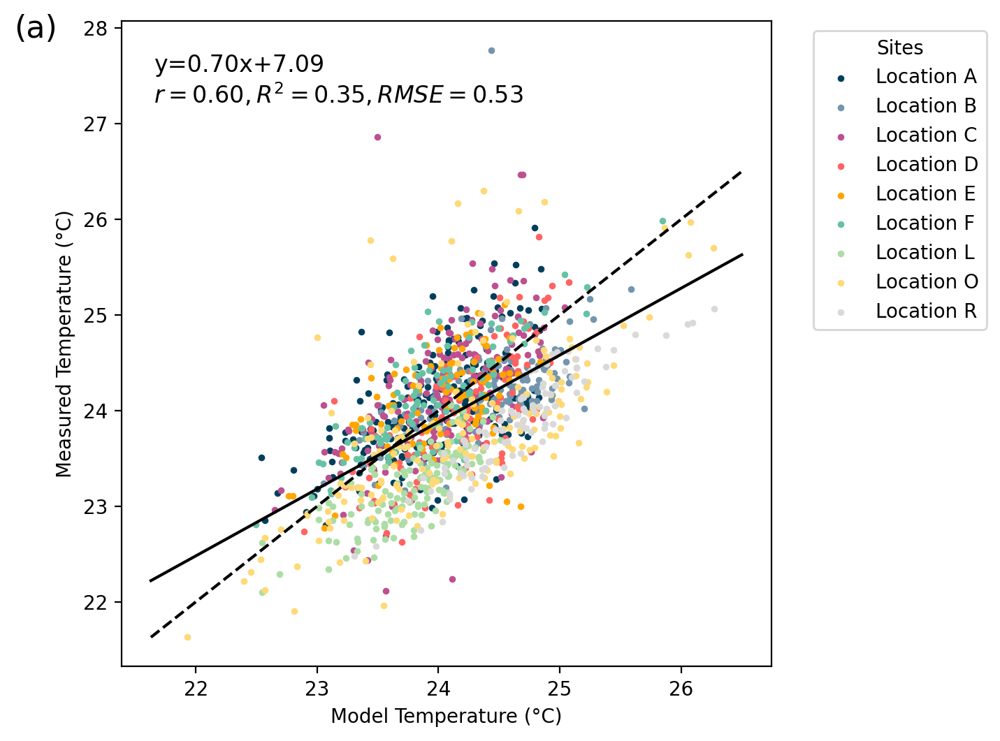

In [587]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import linregress

color_map = {
    'A': '#003f5c',
    'B': '#7395AE',
    'C': '#bc5090',
    'D': '#ff6361',
    'E': '#ffa600',
    'F': '#66c2a5',
    'L': '#abdda4',
    'O': '#fed976',
    'R': '#d9d9d9'
}

variable_names = ['A_586', 'A_587', 'A_588', 'A_590', 'A_591', 'A_592', 'A_593', 'A_594', 'B_600', 'B_602', 'B_605', 'B_607', 'B_608', 'B_609', 'B_610', 'B_611', 'C_617', 'C_619', 'C_620', 'C_621', 'C_622', 'C_623', 'C_624', 'C_625', 'D_632', 'D_633', 'D_636', 'D_637', 'D_638', 'E_648', 'E_656', 'E_657', 'E_659', 'F_672', 'F_674', 'LFE_705', 'LFE_706', 'LFE_708', 'LFE_710', 'OG1_714', 'OG1_717', 'OG1_718', 'OG1_719', 'OG2_720', 'RP_5m_A0', 'RP_5m_B0']

all_models = []
all_measures = []

plt.figure(figsize=(6, 6), dpi=200)

legend_labels = set()  

for var_name in variable_names:
    initial = var_name[0]
    color = color_map.get(initial, 'gray')
    
    model_df = globals()[f'{var_name}_model']
    measure_df = globals()[f'{var_name}_measure']
    
    all_models.extend(model_df['value'])
    all_measures.extend(measure_df['value'])
    
    label = f"Location {initial}" if f"Location {initial}" not in legend_labels else None
    plt.scatter(model_df['value'], measure_df['value'], s=6, color=color, label=label)
    if label:
        legend_labels.add(label)

data_min = min(all_models + all_measures)
data_max = max(all_models + all_measures)

slope, intercept, r_value, p_value, std_err = linregress(all_models, all_measures)
x_vals = np.array([data_min, 26.5])
fit_line = slope * x_vals + intercept
plt.plot(x_vals, fit_line, '-', color='black')
plt.plot([data_min, 26.5], [data_min, 26.5], color='black', linestyle='--')

rmse = np.sqrt(np.mean((np.array(all_measures) - (slope * np.array(all_models) + intercept))**2))

stats_text = f"y={slope:.2f}x+{intercept:.2f}\n$r={r_value:.2f}, R^2={r_value**2:.2f}, RMSE={rmse:.2f}$"
plt.text(0.05, 0.95, stats_text, transform=plt.gca().transAxes, fontsize=12, verticalalignment='top')
plt.text(20.5, 27.9, '(a)', fontsize=16)

plt.xlabel('Model Temperature (°C)')
plt.ylabel('Measured Temperature (°C)')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title="Sites")
plt.show()



In [396]:
#Root Mean Square Error (RMSE)
def rmse(model_values, observed_values):
    mse = np.mean((model_values['value'] - observed_values['value']) ** 2)
    rmse = np.sqrt(mse)
    return rmse

In [397]:
RMSE = {
    'A_586': rmse(A_586_model, A_586_measure), 'A_587': rmse(A_587_model, A_587_measure), 'A_588': rmse(A_588_model, A_588_measure), 'A_590': rmse(A_590_model, A_590_measure), 'A_591': rmse(A_591_model, A_591_measure), 'A_592': rmse(A_592_model, A_592_measure), 'A_593': rmse(A_593_model, A_593_measure), 'A_594': rmse(A_594_model, A_594_measure), 'B_600': rmse(B_600_model, B_600_measure), 'B_602': rmse(B_602_model, B_602_measure), 'B_605': rmse(B_605_model, B_605_measure), 'B_607': rmse(B_607_model, B_607_measure), 'B_608': rmse(B_608_model, B_608_measure), 'B_609': rmse(B_609_model, B_609_measure), 'B_610': rmse(B_610_model, B_610_measure), 'B_611': rmse(B_611_model, B_611_measure), 'C_617': rmse(C_617_model, C_617_measure), 'C_619': rmse(C_619_model, C_619_measure), 'C_620': rmse(C_620_model, C_620_measure), 'C_621': rmse(C_621_model, C_621_measure), 'C_622': rmse(C_622_model, C_622_measure), 'C_623': rmse(C_623_model, C_623_measure), 'C_624': rmse(C_624_model, C_624_measure), 'C_625': rmse(C_625_model, C_625_measure), 'D_632': rmse(D_632_model, D_632_measure), 'D_633': rmse(D_633_model, D_633_measure), 'D_636': rmse(D_636_model, D_636_measure), 'D_637': rmse(D_637_model, D_637_measure), 'D_638': rmse(D_638_model, D_638_measure), 'E_648': rmse(E_648_model, E_648_measure), 'E_656': rmse(E_656_model, E_656_measure),'E_657': rmse(E_657_model, E_657_measure), 'E_659': rmse(E_659_model, E_659_measure), 'F_672': rmse(F_672_model, F_672_measure), 'F_674': rmse(F_674_model, F_674_measure), 'LFE_705': rmse(LFE_705_model, LFE_705_measure), 'LFE_706': rmse(LFE_706_model, LFE_706_measure), 'LFE_708': rmse(LFE_708_model, LFE_708_measure), 'LFE_710': rmse(LFE_710_model, LFE_710_measure), 'OG1_714': rmse(OG1_714_model, OG1_714_measure), 'OG1_717': rmse(OG1_717_model, OG1_717_measure), 'OG1_718': rmse(OG1_718_model, OG1_718_measure), 'OG1_719': rmse(OG1_719_model, OG1_719_measure), 'OG2_720': rmse(OG2_720_model, OG2_720_measure), 'RP_5m_A0': rmse(RP_5m_A0_model, RP_5m_A0_measure), 'RP_5m_B0': rmse(RP_5m_B0_model, RP_5m_B0_measure)
}

In [398]:
RMSE_df = pd.DataFrame(list(RMSE.items()), columns=['ID', 'RMSE'])

RMSE_df.to_excel("RMSE_results.xlsx", index=False)

In [399]:
#Coefficient of Determination (R²)
def Rsquared(model_values, observed_values):
    r_squared = stats.linregress(model_values['value'], observed_values['value']).rvalue ** 2
    return r_squared

In [400]:
# Calculate the coefficient of determination (R²) for each model and observed values pair
R_squared = {
    'A_586': Rsquared(A_586_model, A_586_measure), 
    'A_587': Rsquared(A_587_model, A_587_measure), 
    'A_588': Rsquared(A_588_model, A_588_measure), 
    'A_590': Rsquared(A_590_model, A_590_measure), 
    'A_591': Rsquared(A_591_model, A_591_measure), 
    'A_592': Rsquared(A_592_model, A_592_measure), 
    'A_593': Rsquared(A_593_model, A_593_measure), 
    'A_594': Rsquared(A_594_model, A_594_measure), 
    'B_600': Rsquared(B_600_model, B_600_measure), 
    'B_602': Rsquared(B_602_model, B_602_measure), 
    'B_605': Rsquared(B_605_model, B_605_measure), 
    'B_607': Rsquared(B_607_model, B_607_measure), 
    'B_608': Rsquared(B_608_model, B_608_measure), 
    'B_609': Rsquared(B_609_model, B_609_measure), 
    'B_610': Rsquared(B_610_model, B_610_measure), 
    'B_611': Rsquared(B_611_model, B_611_measure), 
    'C_617': Rsquared(C_617_model, C_617_measure), 
    'C_619': Rsquared(C_619_model, C_619_measure), 
    'C_620': Rsquared(C_620_model, C_620_measure), 
    'C_621': Rsquared(C_621_model, C_621_measure), 
    'C_622': Rsquared(C_622_model, C_622_measure), 
    'C_623': Rsquared(C_623_model, C_623_measure), 
    'C_624': Rsquared(C_624_model, C_624_measure), 
    'C_625': Rsquared(C_625_model, C_625_measure), 
    'D_632': Rsquared(D_632_model, D_632_measure), 
    'D_633': Rsquared(D_633_model, D_633_measure), 
    'D_636': Rsquared(D_636_model, D_636_measure), 
    'D_637': Rsquared(D_637_model, D_637_measure), 
    'D_638': Rsquared(D_638_model, D_638_measure), 
    'E_648': Rsquared(E_648_model, E_648_measure), 
    'E_656': Rsquared(E_656_model, E_656_measure), 
    'E_657': Rsquared(E_657_model, E_657_measure), 
    'E_659': Rsquared(E_659_model, E_659_measure), 
    'F_672': Rsquared(F_672_model, F_672_measure), 
    'F_674': Rsquared(F_674_model, F_674_measure), 
    'LFE_705': Rsquared(LFE_705_model, LFE_705_measure), 
    'LFE_706': Rsquared(LFE_706_model, LFE_706_measure), 
    'LFE_708': Rsquared(LFE_708_model, LFE_708_measure), 
    'LFE_710': Rsquared(LFE_710_model, LFE_710_measure), 
    'OG1_714': Rsquared(OG1_714_model, OG1_714_measure), 
    'OG1_717': Rsquared(OG1_717_model, OG1_717_measure), 
    'OG1_718': Rsquared(OG1_718_model, OG1_718_measure), 
    'OG1_719': Rsquared(OG1_719_model, OG1_719_measure), 
    'OG2_720': Rsquared(OG2_720_model, OG2_720_measure), 
    'RP_5m_A0': Rsquared(RP_5m_A0_model, RP_5m_A0_measure), 
    'RP_5m_B0': Rsquared(RP_5m_B0_model, RP_5m_B0_measure)
}


In [401]:
R_squared_df = pd.DataFrame(list(R_squared.items()), columns=['ID', 'R_squared'])

R_squared_df.to_excel("R_squared_results.xlsx", index=False)

# Step6: Compare different resolution downscaling

In [402]:
# 9km resolution
results_low = {}

def nearest_model(latitude, longitude):
    nearest_model_temp = lowres_temperature.sel(latitude=latitude, longitude=longitude, method="nearest")
    return nearest_model_temp

for index, row in location_data.iterrows():
    file_id = row['ID']
    latitude = row['Latitude']
    longitude = row['Longitude']
    model_low = nearest_model(latitude, longitude)
    results_low[file_id] = {
        'Model_low': model_low
    }

for file_id in results_low:
    globals()[f"{file_id}_model_low"] = results_low[file_id]['Model_low']

In [403]:
# 1km resolution
results_1 = {}

def nearest_model(latitude, longitude):
    nearest_model_temp = lowres_temperature.sel(latitude=latitude, longitude=longitude, method="nearest")
    return nearest_model_temp

for index, row in location_data.iterrows():
    file_id = row['ID']
    latitude = row['Latitude']
    longitude = row['Longitude']
    model_1 = nearest_model(latitude, longitude)
    results_1[file_id] = {
        'Model_1': model_1
    }

for file_id in results_1:
    globals()[f"{file_id}_model_1"] = results_1[file_id]['Model_1']

In [404]:
time_ranges = [
    slice("2013-05-01", "2015-10-31"),
    slice("2018-11-01", "2018-11-30"),
    slice("2018-12-01", "2018-12-31"),
    slice("2019-01-01", "2019-01-31")
]


selected_data = xr.concat(
    [A_586_model_low.sel(time=tr) for tr in time_ranges],
    dim='time'
)

A_586_model_low = selected_data - 273.15
#A_587
time_ranges = [
    slice("2013-05-01", "2015-10-31"),
    slice("2018-11-01", "2018-11-30"),
    slice("2018-12-01", "2018-12-31"),
    slice("2019-01-01", "2019-01-31")
]
selected_data = xr.concat(
    [A_587_model_low.sel(time=tr) for tr in time_ranges],
    dim='time'
)
A_587_model_low = selected_data - 273.15
#A_588
time_ranges = [
    slice("2013-05-01", "2015-10-31"),
    slice("2018-11-01", "2018-11-30"),
    slice("2018-12-01", "2018-12-31"),
    slice("2019-01-01", "2019-01-31")
]
selected_data = xr.concat(
    [A_588_model_low.sel(time=tr) for tr in time_ranges],
    dim='time'
)
A_588_model_low = selected_data - 273.15
#A_590
time_ranges = [
    slice("2013-05-01", "2015-10-31"),
    slice("2018-11-01", "2018-11-30"),
    slice("2018-12-01", "2018-12-31"),
    slice("2019-01-01", "2019-01-31")
]
selected_data = xr.concat(
    [A_590_model_low.sel(time=tr) for tr in time_ranges],
    dim='time'
)
A_590_model_low = selected_data - 273.15
#A_591
time_ranges = [
    slice("2013-05-01", "2013-08-31"),
    slice("2014-05-01", "2014-07-31"),
    slice("2015-02-01", "2015-03-31"),
    slice("2018-11-01", "2019-01-31")
]
selected_data = xr.concat(
    [A_591_model_low.sel(time=tr) for tr in time_ranges],
    dim='time'
)
A_591_model_low = selected_data - 273.15
#A_592
time_ranges = [
    slice("2013-05-01", "2014-02-28"),
    slice("2014-05-01", "2014-06-30"),
    slice("2015-02-01", "2015-03-31"),
    slice("2016-08-01", "2016-09-30"),
    slice("2018-11-01", "2019-01-31")
]
selected_data = xr.concat(
    [A_592_model_low.sel(time=tr) for tr in time_ranges],
    dim='time'
)
A_592_model_low = selected_data - 273.15
#A_593
time_ranges = [
    slice("2013-05-01", "2015-11-30"),
    slice("2018-11-01", "2019-01-31")
]
selected_data = xr.concat(
    [A_593_model_low.sel(time=tr) for tr in time_ranges],
    dim='time'
)
A_593_model_low = selected_data - 273.15
#A_594
time_ranges = [
    slice("2013-05-01", "2015-07-31")
]
selected_data = xr.concat(
    [A_594_model_low.sel(time=tr) for tr in time_ranges],
    dim='time'
)
A_594_model_low = selected_data - 273.15
#B_600
time_ranges = [
    slice("2014-04-01", "2015-10-31")
]
selected_data = xr.concat(
    [B_600_model_low.sel(time=tr) for tr in time_ranges],
    dim='time'
)
B_600_model_low = selected_data - 273.15
#B_602
time_ranges = [
    slice("2014-04-01", "2015-10-31")
]
selected_data = xr.concat(
    [B_602_model_low.sel(time=tr) for tr in time_ranges],
    dim='time'
)
B_602_model_low = selected_data - 273.15
#B_605
time_ranges = [
    slice("2014-05-01", "2015-06-30"),
    slice("2018-02-01", "2019-09-30")
]
selected_data = xr.concat(
    [B_605_model_low.sel(time=tr) for tr in time_ranges],
    dim='time'
)
B_605_model_low = selected_data - 273.15
#B_607
time_ranges = [
    slice("2014-05-01", "2015-10-31"),
    slice("2016-08-01", "2017-05-31"),
    slice("2018-02-01", "2018-02-28")
]
selected_data = xr.concat(
    [B_607_model_low.sel(time=tr) for tr in time_ranges],
    dim='time'
)
B_607_model_low = selected_data - 273.15
#B_608
time_ranges = [
    slice("2014-04-01", "2015-10-31")
]
selected_data = xr.concat(
    [B_608_model_low.sel(time=tr) for tr in time_ranges],
    dim='time'
)
B_608_model_low = selected_data - 273.15
#B_609
time_ranges = [
    slice("2014-04-01", "2015-01-31")
]
selected_data = xr.concat(
    [B_609_model_low.sel(time=tr) for tr in time_ranges],
    dim='time'
)
B_609_model_low = selected_data - 273.15
#B_610
time_ranges = [
    slice("2014-04-01", "2015-10-31")
]
selected_data = xr.concat(
    [B_610_model_low.sel(time=tr) for tr in time_ranges],
    dim='time'
)
B_610_model_low = selected_data - 273.15
#B_611
time_ranges = [
    slice("2014-04-01", "2014-05-31")
]
selected_data = xr.concat(
    [B_611_model_low.sel(time=tr) for tr in time_ranges],
    dim='time'
)
B_611_model_low = selected_data - 273.15
#C_617    
time_ranges = [
    slice("2013-05-01", "2013-07-31"),
    slice("2014-02-01", "2014-04-30"),
    slice("2015-01-01", "2015-02-28"),
]
selected_data = xr.concat(
    [C_617_model_low.sel(time=tr) for tr in time_ranges],
    dim='time'
)
C_617_model_low = selected_data - 273.15
#C_619      
time_ranges = [
    slice("2013-05-01", "2014-11-30"),
    slice("2015-03-01", "2015-08-31"),
    slice("2016-08-01", "2017-04-30")
]
selected_data = xr.concat(
    [C_619_model_low.sel(time=tr) for tr in time_ranges],
    dim='time'
)
C_619_model_low = selected_data - 273.15
#C_620  
time_ranges = [
    slice("2013-05-01", "2013-06-30"),
    slice("2014-02-01", "2014-04-30"),
    slice("2015-01-01", "2015-03-31"),
    slice("2016-08-01", "2016-08-31")
]
selected_data = xr.concat(
    [C_620_model_low.sel(time=tr) for tr in time_ranges],
    dim='time'
)
C_620_model_low = selected_data - 273.15
#C_621
time_ranges = [
    slice("2013-05-01", "2013-12-31"),
    slice("2014-02-01", "2014-03-31"),
]
selected_data = xr.concat(
    [C_621_model_low.sel(time=tr) for tr in time_ranges],
    dim='time'
)
C_621_model_low = selected_data - 273.15
#C_622
time_ranges = [
    slice("2013-05-01", "2014-06-30"),
    slice("2015-01-01", "2015-01-31")
]
selected_data = xr.concat(
    [C_622_model_low.sel(time=tr) for tr in time_ranges],
    dim='time'
)
C_622_model_low = selected_data - 273.15
#C_623
time_ranges = [
    slice("2013-05-01", "2015-01-31"),
]
selected_data = xr.concat(
    [C_623_model_low.sel(time=tr) for tr in time_ranges],
    dim='time'
)
C_623_model_low = selected_data - 273.15
#C_624
time_ranges = [
    slice("2013-05-01", "2015-11-30"),
]
selected_data = xr.concat(
    [C_624_model_low.sel(time=tr) for tr in time_ranges],
    dim='time'
)
C_624_model_low = selected_data - 273.15
#C_625
time_ranges = [
    slice("2013-05-01", "2015-11-30"),
]
selected_data = xr.concat(
    [C_625_model_low.sel(time=tr) for tr in time_ranges],
    dim='time'
)
C_625_model_low = selected_data - 273.15
#D_632
time_ranges = [
    slice("2013-05-01", "2014-11-30"),
    slice("2015-01-01", "2015-11-30"),
]
selected_data = xr.concat(
    [D_632_model_low.sel(time=tr) for tr in time_ranges],
    dim='time'
)
D_632_model_low = selected_data - 273.15
#D_633
time_ranges = [
    slice("2013-05-01", "2013-10-31"),
    slice("2014-02-01", "2014-04-30"),
    slice("2015-01-01", "2015-02-28"),
]
selected_data = xr.concat(
    [D_633_model_low.sel(time=tr) for tr in time_ranges],
    dim='time'
)
D_633_model_low = selected_data - 273.15
#D_636
time_ranges = [
    slice("2013-05-01", "2013-08-31"),
    slice("2014-02-01", "2014-05-31"),
    slice("2015-01-01", "2015-04-30"),
    slice("2016-08-01", "2016-09-30")
]
selected_data = xr.concat(
    [D_636_model_low.sel(time=tr) for tr in time_ranges],
    dim='time'
)
D_636_model_low = selected_data - 273.15
#D_637
time_ranges = [
    slice("2013-05-01", "2013-11-30"),
    slice("2014-02-01", "2014-09-30"),
    slice("2015-01-01", "2015-02-28"),
    slice("2016-08-01", "2016-09-30")
]
selected_data = xr.concat(
    [D_637_model_low.sel(time=tr) for tr in time_ranges],
    dim='time'
)
D_637_model_low = selected_data - 273.15
#D_638
time_ranges = [
    slice("2013-05-01", "2014-11-30"),
    slice("2015-01-01", "2015-11-30"),
    slice("2016-08-01", "2017-01-31")
]
selected_data = xr.concat(
    [D_638_model_low.sel(time=tr) for tr in time_ranges],
    dim='time'
)
D_638_model_low = selected_data - 273.15
#E_648
time_ranges = [
    slice("2013-11-01", "2015-01-31"),
    slice("2016-09-01", "2017-04-30"),
    slice("2019-01-01", "2019-03-31")
]
selected_data = xr.concat(
    [E_648_model_low.sel(time=tr) for tr in time_ranges],
    dim='time'
)
E_648_model_low = selected_data - 273.15
#E_656
time_ranges = [
    slice("2013-11-01", "2014-02-28"),
    slice("2016-09-01", "2017-04-30")
]
selected_data = xr.concat(
    [E_656_model_low.sel(time=tr) for tr in time_ranges],
    dim='time'
)
E_656_model_low = selected_data - 273.15
#E_657
time_ranges = [
    slice("2013-11-01", "2014-05-31"),
    slice("2015-01-01", "2015-11-30"),
    slice("2016-09-01", "2017-04-30"),
    slice("2018-02-01", "2019-03-31")
]
selected_data = xr.concat(
    [E_657_model_low.sel(time=tr) for tr in time_ranges],
    dim='time'
)
E_657_model_low = selected_data - 273.15
#E_659
time_ranges = [
    slice("2013-11-01", "2014-05-31"),
    slice("2015-01-01", "2015-11-30"),
    slice("2016-09-01", "2017-04-30"),
    slice("2019-01-01", "2019-03-31")
]
selected_data = xr.concat(
    [E_659_model_low.sel(time=tr) for tr in time_ranges],
    dim='time'
)
E_659_model_low = selected_data - 273.15
#F_672
time_ranges = [
    slice("2013-05-01", "2018-09-30")
]
selected_data = xr.concat(
    [F_672_model_low.sel(time=tr) for tr in time_ranges],
    dim='time'
)
F_672_model_low = selected_data - 273.15
#F_674
time_ranges = [
    slice("2013-05-01", "2015-01-31"),
    slice("2016-04-01", "2017-08-31"),
    slice("2018-07-01", "2018-09-30")
]
selected_data = xr.concat(
    [F_674_model_low.sel(time=tr) for tr in time_ranges],
    dim='time'
)
F_674_model_low = selected_data - 273.15
#LFE_705
time_ranges = [
    slice("2015-01-01", "2015-11-30"),
    slice("2016-08-01", "2017-01-31"),
    slice("2018-02-01", "2018-09-30")
]
selected_data = xr.concat(
    [LFE_705_model_low.sel(time=tr) for tr in time_ranges],
    dim='time'
)
LFE_705_model_low = selected_data - 273.15
#LFE_706
time_ranges = [
    slice("2013-06-01", "2015-11-30"),
    slice("2016-08-01", "2017-01-31"),
    slice("2018-02-01", "2018-09-30")
]
selected_data = xr.concat(
    [LFE_706_model_low.sel(time=tr) for tr in time_ranges],
    dim='time'
)
LFE_706_model_low = selected_data - 273.15
#LFE_708
time_ranges = [
    slice("2013-06-01", "2015-01-31"),
    slice("2016-08-01", "2017-01-31"),
    slice("2018-02-01", "2018-09-30")
]
selected_data = xr.concat(
    [LFE_708_model_low.sel(time=tr) for tr in time_ranges],
    dim='time'
)
LFE_708_model_low = selected_data - 273.15
#LFE_710
time_ranges = [
    slice("2013-06-01", "2014-09-30"),
    slice("2015-01-01", "2015-11-30"),
    slice("2016-08-01", "2017-01-31"),
    slice("2018-02-01", "2018-09-30")
]
selected_data = xr.concat(
    [LFE_710_model_low.sel(time=tr) for tr in time_ranges],
    dim='time'
)
LFE_710_model_low = selected_data - 273.15
#OG1_714
time_ranges = [
    slice("2013-07-01", "2017-02-28")
]
selected_data = xr.concat(
    [OG1_714_model_low.sel(time=tr) for tr in time_ranges],
    dim='time'
)
OG1_714_model_low = selected_data - 273.15
#OG1_717
time_ranges = [
    slice("2013-11-01", "2014-11-30"),
    slice("2015-01-01", "2017-02-28"),
]
selected_data = xr.concat(
    [OG1_717_model_low.sel(time=tr) for tr in time_ranges],
    dim='time'
)
OG1_717_model_low = selected_data - 273.15
#OG1_718
time_ranges = [
    slice("2013-07-01", "2017-02-28")
]
selected_data = xr.concat(
    [OG1_718_model_low.sel(time=tr) for tr in time_ranges],
    dim='time'
)
OG1_718_model_low = selected_data - 273.15
#OG1_719
time_ranges = [
    slice("2013-11-01", "2014-09-30"),
    slice("2015-01-01", "2015-04-30"),
    slice("2015-12-01", "2015-12-31")
]
selected_data = xr.concat(
    [OG1_719_model_low.sel(time=tr) for tr in time_ranges],
    dim='time'
)
OG1_719_model_low = selected_data - 273.15
#OG2_720
time_ranges = [
    slice("2013-07-01", "2015-12-31"),
    slice("2016-12-01", "2017-03-31")
]
selected_data = xr.concat(
    [OG2_720_model_low.sel(time=tr) for tr in time_ranges],
    dim='time'
)
OG2_720_model_low = selected_data - 273.15
#RP_5m_A0
time_ranges = [
    slice("2013-06-01", "2017-03-31")
]
selected_data = xr.concat(
    [RP_5m_A0_model_low.sel(time=tr) for tr in time_ranges],
    dim='time'
)
RP_5m_A0_model_low = selected_data - 273.15
#RP_5m_B0
time_ranges = [
    slice("2013-06-01", "2017-03-31")
]
selected_data = xr.concat(
    [RP_5m_B0_model_low.sel(time=tr) for tr in time_ranges],
    dim='time'
)
RP_5m_B0_model_low = selected_data - 273.15


In [405]:
model_low = {'A_586_model_low': A_586_model_low,'A_587_model_low': A_587_model_low,"A_587_model_low": A_587_model_low,"A_588_model_low": A_588_model_low,"A_590_model_low": A_590_model_low,"A_591_model_low": A_591_model_low,"A_592_model_low": A_592_model_low,"A_593_model_low": A_593_model_low,"A_594_model_low": A_594_model_low,"B_600_model_low": B_600_model_low,"B_602_model_low": B_602_model_low,"B_605_model_low": B_605_model_low,"B_607_model_low": B_607_model_low,"B_608_model_low": B_608_model_low,"B_609_model_low": B_609_model_low,"B_610_model_low": B_610_model_low,"B_611_model_low": B_611_model_low,"C_617_model_low": C_617_model_low,"C_619_model_low": C_619_model_low,"C_620_model_low": C_620_model_low,"C_621_model_low": C_621_model_low,"C_622_model_low": C_622_model_low,"C_623_model_low": C_623_model_low,"C_624_model_low": C_624_model_low,"C_625_model_low": C_625_model_low,"D_632_model_low": D_632_model_low,"D_633_model_low": D_633_model_low,"D_636_model_low": D_636_model_low,"D_637_model_low": D_637_model_low,"D_638_model_low": D_638_model_low,"E_648_model_low": E_648_model_low,"E_656_model_low": E_656_model_low,"E_657_model_low": E_657_model_low,"E_659_model_low": E_659_model_low,"F_672_model_low": F_672_model_low,"F_674_model_low": F_674_model_low,"LFE_705_model_low": LFE_705_model_low,"LFE_706_model_low": LFE_706_model_low,"LFE_708_model_low": LFE_708_model_low,"LFE_710_model_low": LFE_710_model_low,"OG1_714_model_low": OG1_714_model_low,"OG1_717_model_low": OG1_717_model_low,"OG1_718_model_low": OG1_718_model_low,"OG1_719_model_low": OG1_719_model_low,"OG2_720_model_low": OG2_720_model_low,"RP_5m_A0_model_low": RP_5m_A0_model_low,"RP_5m_B0_model_low": RP_5m_B0_model_low}


for key in model_low:
    temp_df = model_low[key].to_dataframe()
    
    temp_df = temp_df.iloc[:, 2].to_frame(name='value')
    
    temp_df.index = temp_df.index.get_level_values('time').strftime('%Y-%m')
    
    globals()[key] = temp_df

In [406]:
lat_lon_list_low = []

for model_name, model_data in model_low.items():
    lat_vals = model_data['latitude'].values.flatten()
    lon_vals = model_data['longitude'].values.flatten()
    lat_lon_pairs = zip(lat_vals, lon_vals)
    lat_lon_list_low.extend(lat_lon_pairs)

lat_lon_df_low = pd.DataFrame(lat_lon_list_low, columns=['Latitude', 'Longitude'])

lat_lon_df_low
lat_lon_df_low.to_csv('9km_lon_lat.csv', index=False)


In [407]:
def prepare_model_low_data(model_dict):
    new_model_low_dict = {}
    for key, data in model_dict.items():
        temp_df = data.to_dataframe()
        
        if len(temp_df.columns) == 1:
            temp_df.columns = ['value']
        else:
            temp_df = temp_df.iloc[:, 2].to_frame(name='value')
        
        temp_df.index = temp_df.index.get_level_values('time').strftime('%Y-%m')
        
        new_model_low_dict[key] = temp_df
    return new_model_low_dict

new_model_low = prepare_model_low_data(model_low)


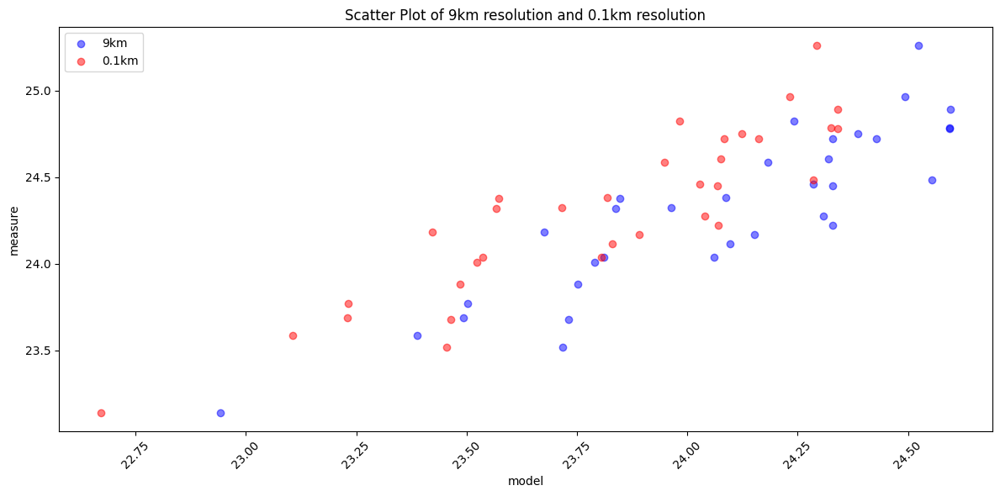

In [408]:
plt.figure(figsize=(12, 6))
plt.scatter(A_586_model_low['value'],A_586_measure['value'], label='9km', color='blue', alpha=0.5)
plt.scatter(A_586_model['value'], A_586_measure['value'], label='0.1km', color='red', alpha=0.5)

plt.title('Scatter Plot of 9km resolution and 0.1km resolution')
plt.xlabel('model')
plt.ylabel('measure')
plt.xticks(rotation=45)
plt.legend()

plt.tight_layout()
plt.show()

In [409]:
new_model_1 = {}
model_keys_1 = ['A_586_model_1', 'A_587_model_1', 'A_588_model_1', 'A_590_model_1', 'A_591_model_1', 'A_592_model_1', 'A_593_model_1', 'A_594_model_1', 'B_600_model_1', 'B_602_model_1', 'B_605_model_1', 'B_607_model_1', 'B_608_model_1', 'B_609_model_1', 'B_610_model_1', 'B_611_model_1', 'C_617_model_1', 'C_619_model_1', 'C_620_model_1', 'C_621_model_1', 'C_622_model_1', 'C_623_model_1', 'C_624_model_1', 'C_625_model_1', 'D_632_model_1', 'D_633_model_1', 'D_636_model_1', 'D_637_model_1', 'D_638_model_1', 'E_648_model_1', 'E_656_model_1', 'E_657_model_1', 'E_659_model_1', 'F_672_model_1', 'F_674_model_1', 'LFE_705_model_1', 'LFE_706_model_1', 'LFE_708_model_1', 'LFE_710_model_1', 'OG1_714_model_1', 'OG1_717_model_1', 'OG1_718_model_1', 'OG1_719_model_1', 'OG2_720_model_1', 'RP_5m_A0_model_1', 'RP_5m_B0_model_1']  # 继续列出所有键

In [410]:
new_model_4 = {}
model_keys_4 = ['A_586_model_4', 'A_587_model_4', 'A_588_model_4', 'A_590_model_4', 'A_591_model_4', 'A_592_model_4', 'A_593_model_4', 'A_594_model_4', 'B_600_model_4', 'B_602_model_4', 'B_605_model_4', 'B_607_model_4', 'B_608_model_4', 'B_609_model_4', 'B_610_model_4', 'B_611_model_4', 'C_617_model_4', 'C_619_model_4', 'C_620_model_4', 'C_621_model_4', 'C_622_model_4', 'C_623_model_4', 'C_624_model_4', 'C_625_model_4', 'D_632_model_4', 'D_633_model_4', 'D_636_model_4', 'D_637_model_4', 'D_638_model_4', 'E_648_model_4', 'E_656_model_4', 'E_657_model_4', 'E_659_model_4', 'F_672_model_4', 'F_674_model_4', 'LFE_705_model_4', 'LFE_706_model_4', 'LFE_708_model_4', 'LFE_710_model_4', 'OG1_714_model_4', 'OG1_717_model_4', 'OG1_718_model_4', 'OG1_719_model_4', 'OG2_720_model_4', 'RP_5m_A0_model_4', 'RP_5m_B0_model_4']  # 继续列出所有键

In [411]:
for key in model_keys_1:
    new_model_1[key] = pd.read_csv(f'{key}.csv')

In [412]:
for key in model_keys_4:
    new_model_4[key] = pd.read_csv(f'{key}.csv')

In [413]:
A_586_model

,latitude,longitude,value
time,,,
2013-05,4.708178,117.65672,24.040587
2013-06,4.708178,117.65672,24.285504
2013-07,4.708178,117.65672,23.486151
2013-08,4.708178,117.65672,23.455497
2013-09,4.708178,117.65672,23.890946
2013-10,4.708178,117.65672,23.805179
2013-11,4.708178,117.65672,23.232337
2013-12,4.708178,117.65672,23.536695
2014-01,4.708178,117.65672,22.672334


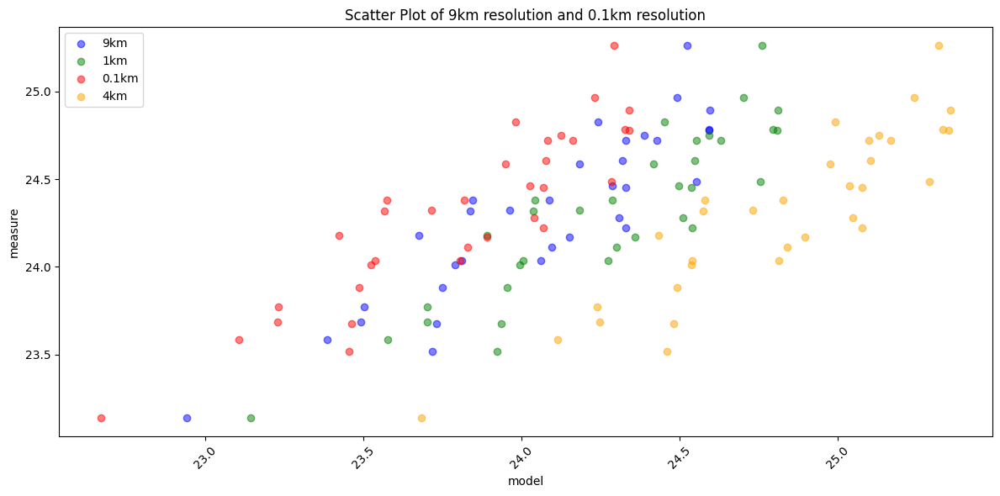

In [414]:
plt.figure(figsize=(12, 6))
plt.scatter(A_586_model_low['value'],A_586_measure['value'], label='9km', color='blue', alpha=0.5)
plt.scatter(new_model_1['A_586_model_1']['value'], A_586_measure['value'], label='1km', color='green', alpha=0.5)
plt.scatter(A_586_model['value'], A_586_measure['value'], label='0.1km', color='red', alpha=0.5)
plt.scatter(new_model_4['A_586_model_4']['value'], A_586_measure['value'], label='4km', color='orange', alpha=0.5)

plt.title('Scatter Plot of 9km resolution and 0.1km resolution')
plt.xlabel('model')
plt.ylabel('measure')
plt.xticks(rotation=45)
plt.legend()

plt.tight_layout()
plt.show()

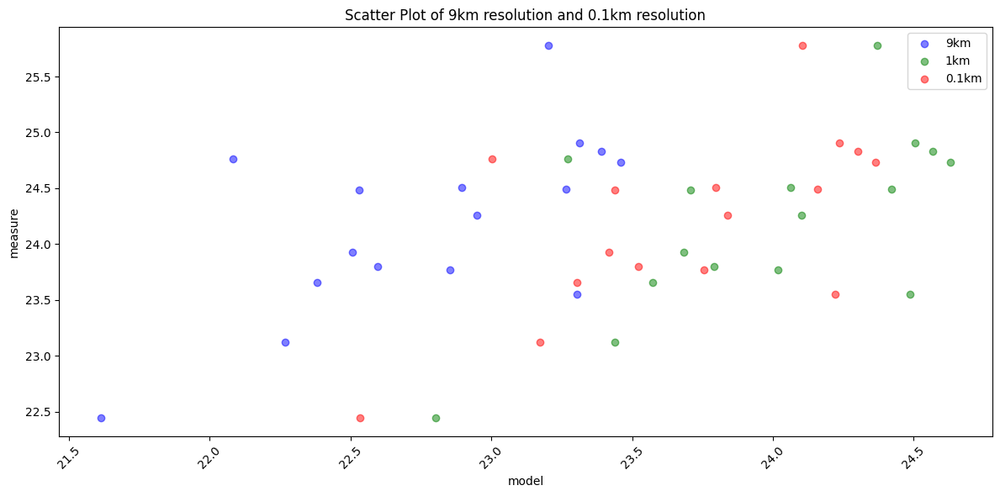

In [415]:
plt.figure(figsize=(12, 6))
plt.scatter(OG1_719_model_low['value'],OG1_719_measure['value'], label='9km', color='blue', alpha=0.5)
plt.scatter(new_model_1['OG1_719_model_1']['value'], OG1_719_measure['value'], label='1km', color='green', alpha=0.5)
plt.scatter(OG1_719_model['value'], OG1_719_measure['value'], label='0.1km', color='red', alpha=0.5)

plt.title('Scatter Plot of 9km resolution and 0.1km resolution')
plt.xlabel('model')
plt.ylabel('measure')
plt.xticks(rotation=45)
plt.legend()

plt.tight_layout()
plt.show()

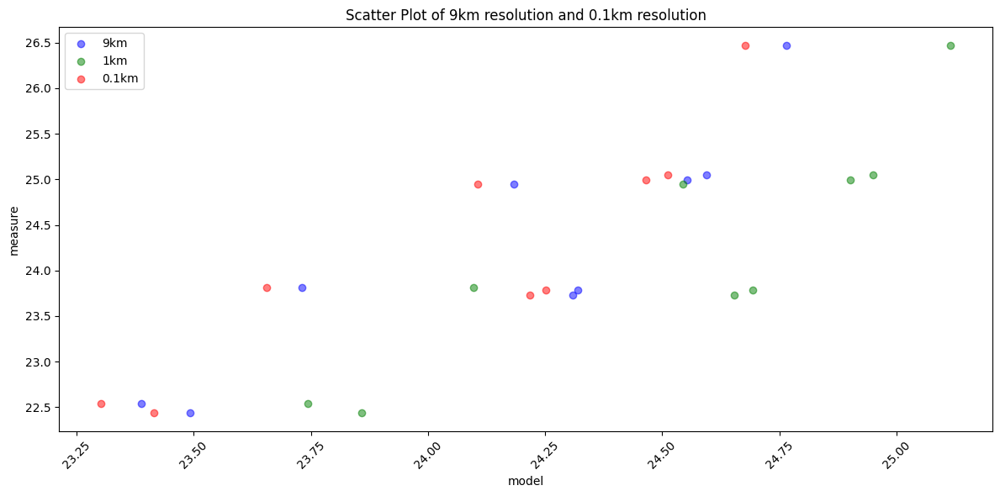

In [416]:
plt.figure(figsize=(12, 6))
plt.scatter(C_620_model_low['value'],C_620_measure['value'], label='9km', color='blue', alpha=0.5)
plt.scatter(new_model_1['C_620_model_1']['value'], C_620_measure['value'], label='1km', color='green', alpha=0.5)
plt.scatter(C_620_model['value'], C_620_measure['value'], label='0.1km', color='red', alpha=0.5)

plt.title('Scatter Plot of 9km resolution and 0.1km resolution')
plt.xlabel('model')
plt.ylabel('measure')
plt.xticks(rotation=45)
plt.legend()

plt.tight_layout()
plt.show()

In [417]:
# Concatenate measure dataframes vertically
measure_whole = pd.concat([A_586_measure, A_587_measure, A_588_measure, A_590_measure, A_591_measure, A_592_measure, A_593_measure, A_594_measure, B_600_measure, B_602_measure, B_605_measure, B_607_measure, B_608_measure, B_609_measure, B_610_measure, B_611_measure, C_617_measure, C_619_measure, C_620_measure, C_621_measure, C_622_measure, C_623_measure, C_624_measure, C_625_measure, D_632_measure, D_633_measure, D_636_measure, D_637_measure, D_638_measure, E_648_measure, E_656_measure, E_657_measure, E_659_measure, F_672_measure, F_674_measure, LFE_705_measure, LFE_706_measure, LFE_708_measure, LFE_710_measure, OG1_714_measure, OG1_717_measure, OG1_718_measure, OG1_719_measure, OG2_720_measure, RP_5m_A0_measure, RP_5m_B0_measure], axis=0)
# Sort measure dataframe by index
measure_whole = measure_whole.sort_index()
# Extract 'value' column from measure dataframe
measure_values = measure_whole['value']

# Concatenate model dataframes vertically
model_whole_low = pd.concat([A_586_model_low, A_587_model_low, A_588_model_low, A_590_model_low, A_591_model_low, A_592_model_low, A_593_model_low, A_594_model_low, B_600_model_low, B_602_model_low, B_605_model_low, B_607_model_low, B_608_model_low, B_609_model_low, B_610_model_low, B_611_model_low, C_617_model_low, C_619_model_low, C_620_model_low, C_621_model_low, C_622_model_low, C_623_model_low, C_624_model_low, C_625_model_low, D_632_model_low, D_633_model_low, D_636_model_low, D_637_model_low, D_638_model_low, E_648_model_low, E_656_model_low, E_657_model_low, E_659_model_low, F_672_model_low, F_674_model_low, LFE_705_model_low, LFE_706_model_low, LFE_708_model_low, LFE_710_model_low, OG1_714_model_low, OG1_717_model_low, OG1_718_model_low, OG1_719_model_low, OG2_720_model_low, RP_5m_A0_model_low, RP_5m_B0_model_low], axis=0)
# Sort model dataframe by index
model_whole_low = model_whole_low.sort_index()
# Extract 'value' column from model dataframe
model_values_low = model_whole_low['value']

# Concatenate model dataframes vertically
model_whole = pd.concat([A_586_model, A_587_model, A_588_model, A_590_model, A_591_model, A_592_model, A_593_model, A_594_model, B_600_model, B_602_model, B_605_model, B_607_model, B_608_model, B_609_model, B_610_model, B_611_model, C_617_model, C_619_model, C_620_model, C_621_model, C_622_model, C_623_model, C_624_model, C_625_model, D_632_model, D_633_model, D_636_model, D_637_model, D_638_model, E_648_model, E_656_model, E_657_model, E_659_model, F_672_model, F_674_model, LFE_705_model, LFE_706_model, LFE_708_model, LFE_710_model, OG1_714_model, OG1_717_model, OG1_718_model, OG1_719_model, OG2_720_model, RP_5m_A0_model, RP_5m_B0_model], axis=0)
# Sort model dataframe by index
model_whole = model_whole.sort_index()
# Extract 'value' column from model dataframe
model_values = model_whole['value']


In [418]:
# Concatenate model dataframes vertically
model_whole_1 = pd.concat([new_model_1['A_586_model_1'], new_model_1['A_587_model_1'], new_model_1['A_588_model_1'], new_model_1['A_590_model_1'], new_model_1['A_591_model_1'], new_model_1['A_592_model_1'], new_model_1['A_593_model_1'], new_model_1['A_594_model_1'], new_model_1['B_600_model_1'], new_model_1['B_602_model_1'], new_model_1['B_605_model_1'], new_model_1['B_607_model_1'], new_model_1['B_608_model_1'], new_model_1['B_609_model_1'], new_model_1['B_610_model_1'], new_model_1['B_611_model_1'], new_model_1['C_617_model_1'], new_model_1['C_619_model_1'], new_model_1['C_620_model_1'], new_model_1['C_621_model_1'], new_model_1['C_622_model_1'], new_model_1['C_623_model_1'], new_model_1['C_624_model_1'], new_model_1['C_625_model_1'], new_model_1['D_632_model_1'], new_model_1['D_633_model_1'], new_model_1['D_636_model_1'], new_model_1['D_637_model_1'], new_model_1['D_638_model_1'], new_model_1['E_648_model_1'], new_model_1['E_656_model_1'], new_model_1['E_657_model_1'], new_model_1['E_659_model_1'], new_model_1['F_672_model_1'], new_model_1['F_674_model_1'], new_model_1['LFE_705_model_1'], new_model_1['LFE_706_model_1'], new_model_1['LFE_708_model_1'], new_model_1['LFE_710_model_1'], new_model_1['OG1_714_model_1'], new_model_1['OG1_717_model_1'], new_model_1['OG1_718_model_1'], new_model_1['OG1_719_model_1'], new_model_1['OG2_720_model_1'], new_model_1['RP_5m_A0_model_1'], new_model_1['RP_5m_B0_model_1']], axis=0)
# Sort model dataframe by index
model_whole_1 = model_whole_1.sort_index()
# Extract 'value' column from model dataframe
model_values_1 = model_whole_1['value']

# Concatenate model dataframes vertically
model_whole_4 = pd.concat([new_model_4['A_586_model_4'], new_model_4['A_587_model_4'], new_model_4['A_588_model_4'], new_model_4['A_590_model_4'], new_model_4['A_591_model_4'], new_model_4['A_592_model_4'], new_model_4['A_593_model_4'], new_model_4['A_594_model_4'], new_model_4['B_600_model_4'], new_model_4['B_602_model_4'], new_model_4['B_605_model_4'], new_model_4['B_607_model_4'], new_model_4['B_608_model_4'], new_model_4['B_609_model_4'], new_model_4['B_610_model_4'], new_model_4['B_611_model_4'], new_model_4['C_617_model_4'], new_model_4['C_619_model_4'], new_model_4['C_620_model_4'], new_model_4['C_621_model_4'], new_model_4['C_622_model_4'], new_model_4['C_623_model_4'], new_model_4['C_624_model_4'], new_model_4['C_625_model_4'], new_model_4['D_632_model_4'], new_model_4['D_633_model_4'], new_model_4['D_636_model_4'], new_model_4['D_637_model_4'], new_model_4['D_638_model_4'], new_model_4['E_648_model_4'], new_model_4['E_656_model_4'], new_model_4['E_657_model_4'], new_model_4['E_659_model_4'], new_model_4['F_672_model_4'], new_model_4['F_674_model_4'], new_model_4['LFE_705_model_4'], new_model_4['LFE_706_model_4'], new_model_4['LFE_708_model_4'], new_model_4['LFE_710_model_4'], new_model_4['OG1_714_model_4'], new_model_4['OG1_717_model_4'], new_model_4['OG1_718_model_4'], new_model_4['OG1_719_model_4'], new_model_4['OG2_720_model_4'], new_model_4['RP_5m_A0_model_4'], new_model_4['RP_5m_B0_model_4']], axis=0)
# Sort model dataframe by index
model_whole_4 = model_whole_4.sort_index()
# Extract 'value' column from model dataframe
model_values_4 = model_whole_4['value']

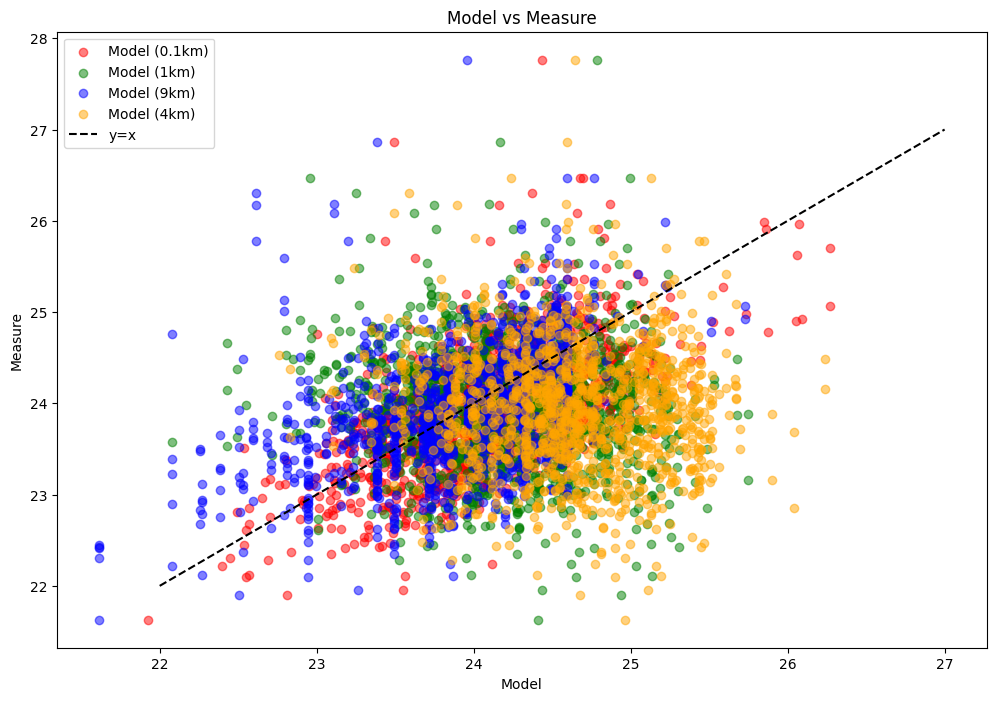

In [419]:
# Plot the data
plt.figure(figsize=(12, 8))
plt.scatter(model_values, measure_values, label='Model (0.1km)', alpha=0.5, color='red')
plt.scatter(model_values_1, measure_values, label='Model (1km)', alpha=0.5, color='green')
plt.scatter(model_values_low, measure_values, label='Model (9km)', alpha=0.5, color='blue')
plt.scatter(model_values_4, measure_values, label='Model (4km)', alpha=0.5, color='orange')
plt.plot([22, 27], 
        [22, 27], 
        'k--', label='y=x')  # Plotting y=x line
plt.xlabel('Model')
plt.ylabel('Measure')
plt.title('Model vs Measure')
plt.legend()
plt.show()

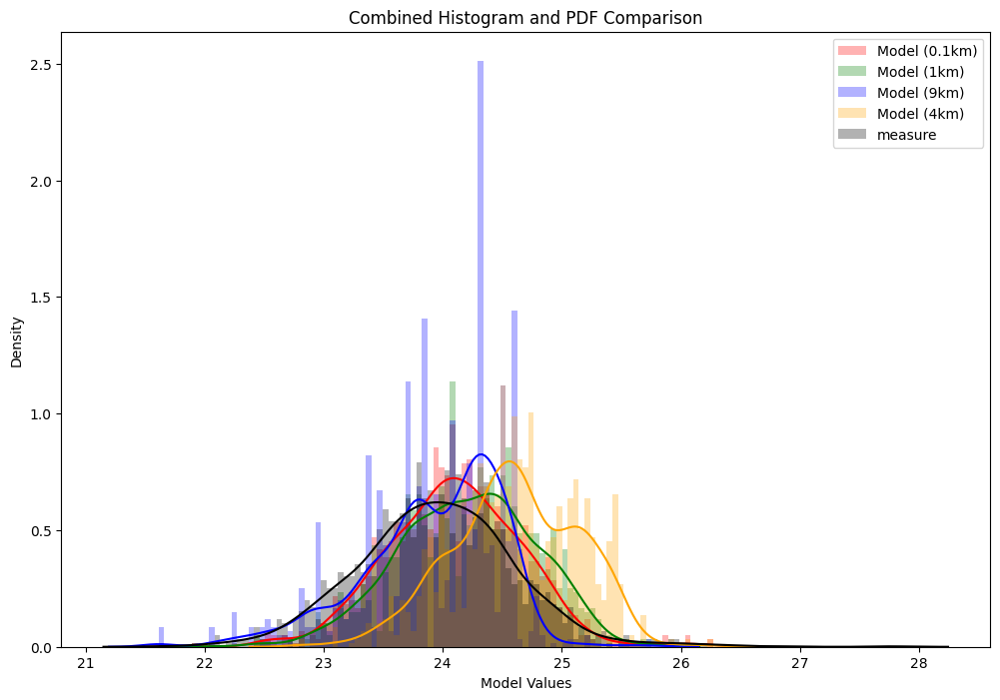

In [420]:
# Plot PDFs for different model resolutions
# Combined plot of PDFs and histograms for model values

model_values = model_values.reset_index(drop=True)
model_values_1 = model_values_1.reset_index(drop=True)
model_values_low = model_values_low.reset_index(drop=True)
model_values_4 = model_values_4.reset_index(drop=True)
measure_values = measure_values.reset_index(drop=True)

plt.figure(figsize=(12, 8))


# Plot histograms
bins = np.linspace(np.min(np.concatenate([model_values, model_values_1, model_values_low])), 
                   np.max(np.concatenate([model_values, model_values_1, model_values_low])), 100)
plt.hist(model_values, bins=bins, alpha=0.3, color='red', label='Model (0.1km)', density=True)
plt.hist(model_values_1, bins=bins, alpha=0.3, color='green', label='Model (1km)', density=True)
plt.hist(model_values_low, bins=bins, alpha=0.3, color='blue', label='Model (9km)', density=True)
plt.hist(model_values_4, bins=bins, alpha=0.3, color='orange', label='Model (4km)', density=True)
plt.hist(measure_values, bins=bins, alpha=0.3, color='black', label='measure', density=True)

# Plot PDFs
sns.kdeplot(model_values, color="red")
sns.kdeplot(model_values_1, color="green")
sns.kdeplot(model_values_low, color="blue")
sns.kdeplot(model_values_4, color="orange")
sns.kdeplot(measure_values, color="black")

plt.title('Combined Histogram and PDF Comparison')
plt.xlabel('Model Values')
plt.ylabel('Density')
plt.legend()
plt.show()


In [421]:
# Concatenate measure dataframes vertically
measure_A = pd.concat([A_586_measure, A_587_measure, A_588_measure, A_590_measure, A_591_measure, A_592_measure, A_593_measure, A_594_measure], axis=0)
# Sort measure dataframe by index
measure_A = measure_A.sort_index()
# Extract 'value' column from measure dataframe
measure_A = measure_A['value']

# Concatenate model dataframes vertically
model_A_low = pd.concat([A_586_model_low, A_587_model_low, A_588_model_low, A_590_model_low, A_591_model_low, A_592_model_low, A_593_model_low, A_594_model_low], axis=0)
# Sort model dataframe by index
model_A_low = model_A_low.sort_index()
# Extract 'value' column from model dataframe
model_A_low = model_A_low['value']

# Concatenate model dataframes vertically
model_A = pd.concat([A_586_model, A_587_model, A_588_model, A_590_model, A_591_model, A_592_model, A_593_model, A_594_model], axis=0)
# Sort model dataframe by index
model_A = model_A.sort_index()
# Extract 'value' column from model dataframe
model_A = model_A['value']

# Concatenate model dataframes vertically
model_A_1 = pd.concat([new_model_1['A_586_model_1'], new_model_1['A_587_model_1'], new_model_1['A_588_model_1'], new_model_1['A_590_model_1'], new_model_1['A_591_model_1'], new_model_1['A_592_model_1'], new_model_1['A_593_model_1'], new_model_1['A_594_model_1']], axis=0)
# Sort model dataframe by index
model_A_1 = model_A_1.sort_index()
# Extract 'value' column from model dataframe
model_A_1 = model_A_1['value']

# Concatenate model dataframes vertically
model_A_4 = pd.concat([new_model_4['A_586_model_4'], new_model_4['A_587_model_4'], new_model_4['A_588_model_4'], new_model_4['A_590_model_4'], new_model_4['A_591_model_4'], new_model_4['A_592_model_4'], new_model_4['A_593_model_4'], new_model_4['A_594_model_4']], axis=0)
# Sort model dataframe by index
model_A_4 = model_A_4.sort_index()
# Extract 'value' column from model dataframe
model_A_4 = model_A_4['value']

In [422]:
measure_B = pd.concat([B_600_measure, B_602_measure, B_605_measure, B_607_measure, B_608_measure, B_609_measure, B_610_measure, B_611_measure], axis=0)
measure_B = measure_B.sort_index()
measure_B = measure_B['value']

model_B_low = pd.concat([B_600_model_low, B_602_model_low, B_605_model_low, B_607_model_low, B_608_model_low, B_609_model_low, B_610_model_low, B_611_model_low], axis=0)
model_B_low = model_B_low.sort_index()
model_B_low = model_B_low['value']

model_B = pd.concat([B_600_model, B_602_model, B_605_model, B_607_model, B_608_model, B_609_model, B_610_model, B_611_model], axis=0)
model_B = model_B.sort_index()
model_B = model_B['value']

model_B_1 = pd.concat([new_model_1['B_600_model_1'], new_model_1['B_602_model_1'], new_model_1['B_605_model_1'], new_model_1['B_607_model_1'], new_model_1['B_608_model_1'], new_model_1['B_609_model_1'], new_model_1['B_610_model_1'], new_model_1['B_611_model_1']], axis=0)
model_B_1 = model_B_1.sort_index()
model_B_1 = model_B_1['value']

model_B_4 = pd.concat([new_model_4['B_600_model_4'], new_model_4['B_602_model_4'], new_model_4['B_605_model_4'], new_model_4['B_607_model_4'], new_model_4['B_608_model_4'], new_model_4['B_609_model_4'], new_model_4['B_610_model_4'], new_model_4['B_611_model_4']], axis=0)
model_B_4 = model_B_4.sort_index()
model_B_4 = model_B_4['value']

In [423]:
measure_C = pd.concat([C_617_measure, C_619_measure, C_620_measure, C_621_measure, C_622_measure, C_623_measure, C_624_measure, C_625_measure], axis=0)
measure_C = measure_C.sort_index()
measure_C = measure_C['value']

model_C_low = pd.concat([C_617_model_low, C_619_model_low, C_620_model_low, C_621_model_low, C_622_model_low, C_623_model_low, C_624_model_low, C_625_model_low], axis=0)
model_C_low = model_C_low.sort_index()
model_C_low = model_C_low['value']

model_C = pd.concat([C_617_model, C_619_model, C_620_model, C_621_model, C_622_model, C_623_model, C_624_model, C_625_model], axis=0)
model_C = model_C.sort_index()
model_C = model_C['value']

model_C_1 = pd.concat([new_model_1['C_617_model_1'], new_model_1['C_619_model_1'], new_model_1['C_620_model_1'], new_model_1['C_621_model_1'], new_model_1['C_622_model_1'], new_model_1['C_623_model_1'], new_model_1['C_624_model_1'], new_model_1['C_625_model_1']], axis=0)
model_C_1 = model_C_1.sort_index()
model_C_1 = model_C_1['value']

model_C_4 = pd.concat([new_model_4['C_617_model_4'], new_model_4['C_619_model_4'], new_model_4['C_620_model_4'], new_model_4['C_621_model_4'], new_model_4['C_622_model_4'], new_model_4['C_623_model_4'], new_model_4['C_624_model_4'], new_model_4['C_625_model_4']], axis=0)
model_C_4 = model_C_4.sort_index()
model_C_4 = model_C_4['value']


In [424]:
measure_D = pd.concat([D_632_measure, D_633_measure, D_636_measure, D_637_measure, D_638_measure], axis=0)
measure_D = measure_D.sort_index()
measure_D = measure_D['value']

model_D_low = pd.concat([D_632_model_low, D_633_model_low, D_636_model_low, D_637_model_low, D_638_model_low], axis=0)
model_D_low = model_D_low.sort_index()
model_D_low = model_D_low['value']

model_D = pd.concat([D_632_model, D_633_model, D_636_model, D_637_model, D_638_model], axis=0)
model_D = model_D.sort_index()
model_D = model_D['value']

model_D_1 = pd.concat([new_model_1['D_632_model_1'], new_model_1['D_633_model_1'], new_model_1['D_636_model_1'], new_model_1['D_637_model_1'], new_model_1['D_638_model_1']], axis=0)
model_D_1 = model_D_1.sort_index()
model_D_1 = model_D_1['value']

model_D_4 = pd.concat([new_model_4['D_632_model_4'], new_model_4['D_633_model_4'], new_model_4['D_636_model_4'], new_model_4['D_637_model_4'], new_model_4['D_638_model_4']], axis=0)
model_D_4 = model_D_4.sort_index()
model_D_4 = model_D_4['value']

In [425]:
measure_E = pd.concat([E_648_measure, E_656_measure, E_657_measure, E_659_measure], axis=0)
measure_E = measure_E.sort_index()
measure_E = measure_E['value']

model_E_low = pd.concat([E_648_model_low, E_656_model_low, E_657_model_low, E_659_model_low], axis=0)
model_E_low = model_E_low.sort_index()
model_E_low = model_E_low['value']

model_E = pd.concat([E_648_model, E_656_model, E_657_model, E_659_model], axis=0)
model_E = model_E.sort_index()
model_E = model_E['value']

model_E_1 = pd.concat([new_model_1['E_648_model_1'], new_model_1['E_656_model_1'], new_model_1['E_657_model_1'], new_model_1['E_659_model_1']], axis=0)
model_E_1 = model_E_1.sort_index()
model_E_1 = model_E_1['value']

model_E_4 = pd.concat([new_model_4['E_648_model_4'], new_model_4['E_656_model_4'], new_model_4['E_657_model_4'], new_model_4['E_659_model_4']], axis=0)
model_E_4 = model_E_4.sort_index()
model_E_4 = model_E_4['value']

In [426]:
measure_F = pd.concat([F_672_measure, F_674_measure], axis=0)
measure_F = measure_F.sort_index()
measure_F = measure_F['value']

model_F_low = pd.concat([F_672_model_low, F_674_model_low], axis=0)
model_F_low = model_F_low.sort_index()
model_F_low = model_F_low['value']

model_F = pd.concat([F_672_model, F_674_model], axis=0)
model_F = model_F.sort_index()
model_F = model_F['value']

model_F_1 = pd.concat([new_model_1['F_672_model_1'], new_model_1['F_674_model_1']], axis=0)
model_F_1 = model_F_1.sort_index()
model_F_1 = model_F_1['value']

model_F_4 = pd.concat([new_model_4['F_672_model_4'], new_model_4['F_674_model_4']], axis=0)
model_F_4 = model_F_4.sort_index()
model_F_4 = model_F_4['value']

In [427]:
measure_LFE = pd.concat([LFE_705_measure, LFE_706_measure, LFE_708_measure, LFE_710_measure], axis=0)
measure_LFE = measure_LFE.sort_index()
measure_LFE = measure_LFE['value']

model_LFE_low = pd.concat([LFE_705_model_low, LFE_706_model_low, LFE_708_model_low, LFE_710_model_low], axis=0)
model_LFE_low = model_LFE_low.sort_index()
model_LFE_low = model_LFE_low['value']

model_LFE = pd.concat([LFE_705_model, LFE_706_model, LFE_708_model, LFE_710_model], axis=0)
model_LFE = model_LFE.sort_index()
model_LFE = model_LFE['value']

model_LFE_1 = pd.concat([new_model_1['LFE_705_model_1'], new_model_1['LFE_706_model_1'], new_model_1['LFE_708_model_1'], new_model_1['LFE_710_model_1']], axis=0)
model_LFE_1 = model_LFE_1.sort_index()
model_LFE_1 = model_LFE_1['value']

model_LFE_4 = pd.concat([new_model_4['LFE_705_model_4'], new_model_4['LFE_706_model_4'], new_model_4['LFE_708_model_4'], new_model_4['LFE_710_model_4']], axis=0)
model_LFE_4 = model_LFE_4.sort_index()
model_LFE_4 = model_LFE_4['value']

In [428]:
measure_OG = pd.concat([OG1_714_measure, OG1_717_measure, OG1_718_measure, OG1_719_measure, OG2_720_measure], axis=0)
measure_OG = measure_OG.sort_index()
measure_OG = measure_OG['value']

model_OG_low = pd.concat([OG1_714_model_low, OG1_717_model_low, OG1_718_model_low, OG1_719_model_low, OG2_720_model_low], axis=0)
model_OG_low = model_OG_low.sort_index()
model_OG_low = model_OG_low['value']

model_OG = pd.concat([OG1_714_model, OG1_717_model, OG1_718_model, OG1_719_model, OG2_720_model], axis=0)
model_OG = model_OG.sort_index()
model_OG = model_OG['value']

model_OG_1 = pd.concat([new_model_1['OG1_714_model_1'], new_model_1['OG1_717_model_1'], new_model_1['OG1_718_model_1'], new_model_1['OG1_719_model_1'], new_model_1['OG2_720_model_1']], axis=0)
model_OG_1 = model_OG_1.sort_index()
model_OG_1 = model_OG_1['value']

model_OG_4 = pd.concat([new_model_4['OG1_714_model_4'], new_model_4['OG1_717_model_4'], new_model_4['OG1_718_model_4'], new_model_4['OG1_719_model_4'], new_model_4['OG2_720_model_4']], axis=0)
model_OG_4 = model_OG_4.sort_index()
model_OG_4 = model_OG_4['value']


In [429]:
measure_RP = pd.concat([RP_5m_A0_measure, RP_5m_B0_measure], axis=0)
measure_RP = measure_RP.sort_index()
measure_RP = measure_RP['value']

model_RP_low = pd.concat([RP_5m_A0_model_low, RP_5m_B0_model_low], axis=0)
model_RP_low = model_RP_low.sort_index()
model_RP_low = model_RP_low['value']

model_RP = pd.concat([RP_5m_A0_model, RP_5m_B0_model], axis=0)
model_RP = model_RP.sort_index()
model_RP = model_RP['value']

model_RP_1 = pd.concat([new_model_1['RP_5m_A0_model_1'], new_model_1['RP_5m_B0_model_1']], axis=0)
model_RP_1 = model_RP_1.sort_index()
model_RP_1 = model_RP_1['value']

model_RP_4 = pd.concat([new_model_4['RP_5m_A0_model_4'], new_model_4['RP_5m_B0_model_4']], axis=0)
model_RP_4 = model_RP_4.sort_index()
model_RP_4 = model_RP_4['value']

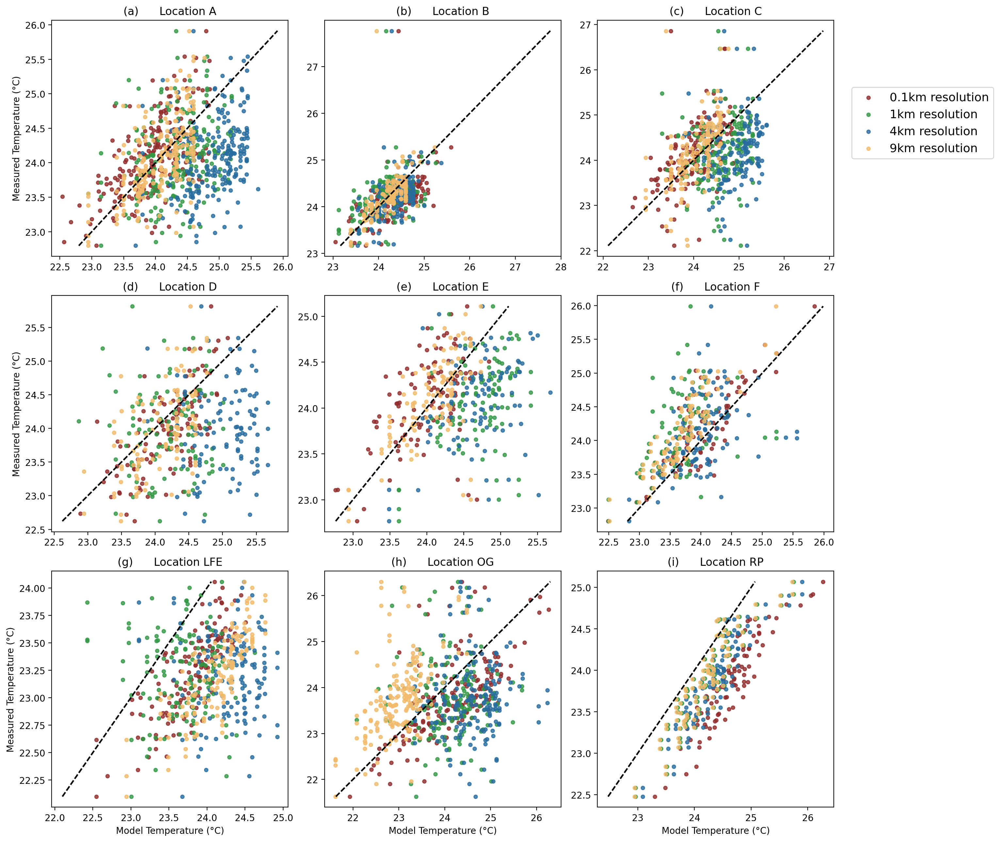

In [530]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import linregress
import pandas as pd

# 假设 model_A, model_A_1, ..., measure_A, ... 已定义

models = [model_A, model_A_1, model_A_4, model_A_low,
          model_B, model_B_1, model_B_4, model_B_low,
          model_C, model_C_1, model_C_4, model_C_low,
          model_D, model_D_1, model_D_4, model_D_low,
          model_E, model_E_1, model_E_4, model_E_low,
          model_F, model_F_1, model_F_4, model_F_low,
          model_LFE, model_LFE_1, model_LFE_4, model_LFE_low,
          model_OG, model_OG_1, model_OG_4, model_OG_low,
          model_RP, model_RP_1, model_RP_4, model_RP_low]
measures = [measure_A, measure_B, measure_C, measure_D, measure_E, measure_F, measure_LFE, measure_OG, measure_RP]
titles = ["(a)      Location A", "(b)      Location B", "(c)      Location C",
          "(d)      Location D", "(e)      Location E", "(f)      Location F",
          "(g)      Location LFE", "(h)      Location OG", "(i)      Location RP"]

fig, axs = plt.subplots(3, 3, figsize=(13, 13), dpi=200)
stats_data = []

def scatter_plot(ax, model_data, measure, title, idx):
    num_rows, num_cols = 3, 3  # Grid size
    colors = ['#912c2c', '#329845', '#276c9e', '#f2bb6b']
    labels = ['0.1km resolution', '1km resolution', '4km resolution', '9km resolution']

    for model, color, label in zip(model_data, colors, labels):
        ax.scatter(model, measure, alpha=0.8, color=color, s=15, label=label)
        slope, intercept, r_value, p_value, std_err = linregress(model, measure)
        rmse = np.sqrt(np.mean((measure - model)**2))
        corr_coef, _ = pearsonr(model, measure)  
        stats_data.append((label, corr_coef, r_value**2, rmse)) 
        ax.plot([min(measure), max(measure)], [min(measure), max(measure)], 'k--')

    ax.set_title(title)

    # Set axis labels based on subplot index
    if idx // num_cols == num_rows - 1:  # Check if it's in the last row
        ax.set_xlabel('Model Temperature (°C)')
    if idx % num_cols == 0:  # Check if it's in the first column
        ax.set_ylabel('Measured Temperature (°C)')

for idx, ax in enumerate(axs.flatten()):
    model_data = models[idx*4:(idx*4)+4]
    scatter_plot(ax, model_data, measures[idx], titles[idx], idx)

# Create and place a single legend outside the plot area
handles, labels = axs[-1, -1].get_legend_handles_labels()
fig.legend(handles, labels, fontsize=13,loc='upper left', bbox_to_anchor=(1, 0.9))

plt.tight_layout()
plt.show()




In [529]:
df_stats = pd.DataFrame(stats_data, columns=['Model', 'Pearson_Correlation', 'R_squared', 'RMSE'])

df_stats.to_excel('model_stats.xlsx', index=False)

In [454]:
# Assuming the need for probability distribution plots for each model and measure
model_A = model_A.reset_index(drop=True)
model_A_1 = model_A_1.reset_index(drop=True)
model_A_low = model_A_low.reset_index(drop=True)
model_A_4 = model_A_4.reset_index(drop=True)
measure_A = measure_A.reset_index(drop=True)
model_B = model_B.reset_index(drop=True)
model_B_1 = model_B_1.reset_index(drop=True)
model_B_low = model_B_low.reset_index(drop=True)
model_B_4 = model_B_4.reset_index(drop=True)
measure_B = measure_B.reset_index(drop=True)
model_C = model_C.reset_index(drop=True)
model_C_1 = model_C_1.reset_index(drop=True)
model_C_low = model_C_low.reset_index(drop=True)
model_C_4 = model_C_4.reset_index(drop=True)
measure_C = measure_C.reset_index(drop=True)
model_D = model_D.reset_index(drop=True)
model_D_1 = model_D_1.reset_index(drop=True)
model_D_low = model_D_low.reset_index(drop=True)
model_D_4 = model_D_4.reset_index(drop=True)
measure_D = measure_D.reset_index(drop=True)
model_E = model_E.reset_index(drop=True)
model_E_1 = model_E_1.reset_index(drop=True)
model_E_low = model_E_low.reset_index(drop=True)
model_E_4 = model_E_4.reset_index(drop=True)
measure_E = measure_E.reset_index(drop=True)
model_F = model_F.reset_index(drop=True)
model_F_1 = model_F_1.reset_index(drop=True)
model_F_low = model_F_low.reset_index(drop=True)
model_F_4 = model_F_4.reset_index(drop=True)
measure_F = measure_F.reset_index(drop=True)
model_LFE = model_LFE.reset_index(drop=True)
model_LFE_1 = model_LFE_1.reset_index(drop=True)
model_LFE_low = model_LFE_low.reset_index(drop=True)
model_LFE_4 = model_LFE_4.reset_index(drop=True)
measure_LFE = measure_LFE.reset_index(drop=True)
model_OG = model_OG.reset_index(drop=True)
model_OG_1 = model_OG_1.reset_index(drop=True)
model_OG_low = model_OG_low.reset_index(drop=True)
model_OG_4 = model_OG_4.reset_index(drop=True)
measure_OG = measure_OG.reset_index(drop=True)
model_RP = model_RP.reset_index(drop=True)
model_RP_1 = model_RP_1.reset_index(drop=True)
model_RP_low = model_RP_low.reset_index(drop=True)
model_RP_4 = model_RP_4.reset_index(drop=True)
measure_RP = measure_RP.reset_index(drop=True)


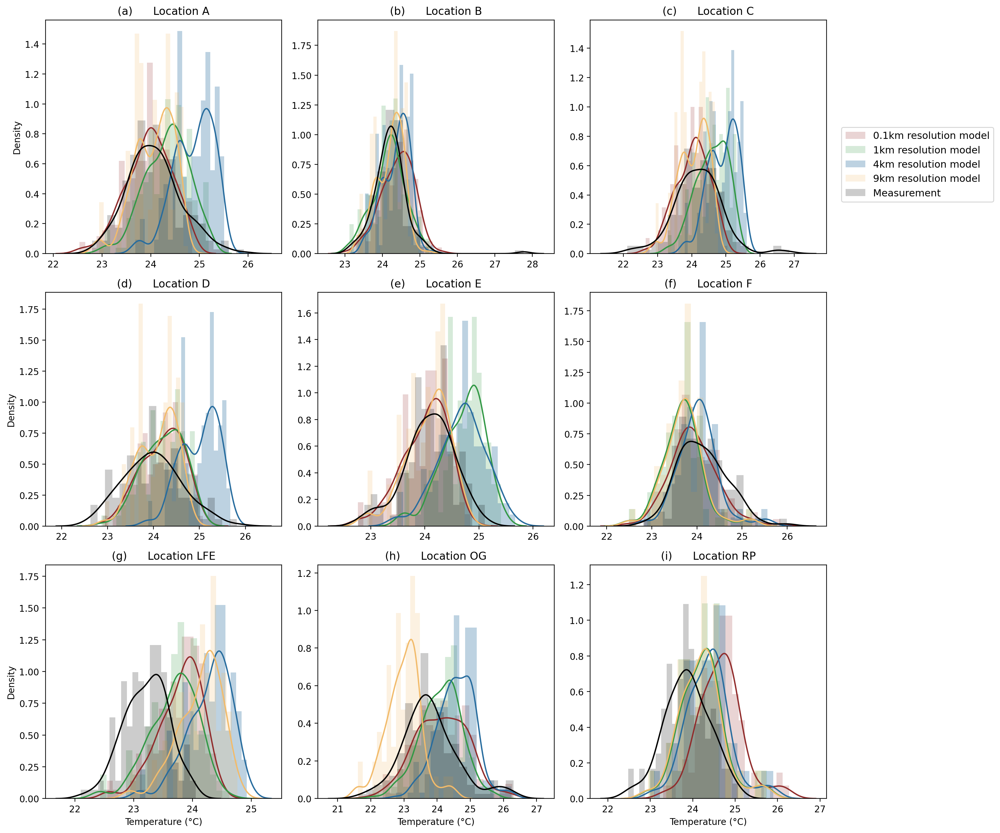

In [533]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.stats import linregress
import pandas as pd

fig, axs = plt.subplots(3, 3, figsize=(13, 13), dpi=200)

def probability_plot(ax, model0, model1, model2, model4, measure, title, idx):
    ax.hist(model0, bins=20, density=True, alpha=0.2, color='#912c2c', label='0.1km resolution model')
    ax.hist(model1, bins=20, density=True, alpha=0.2, color='#329845', label='1km resolution model')
    ax.hist(model4, bins=20, density=True, alpha=0.3, color='#276c9e', label='4km resolution model')
    ax.hist(model2, bins=20, density=True, alpha=0.2, color='#f2bb6b', label='9km resolution model')
    ax.hist(measure, bins=20, density=True, alpha=0.2, color='black', label='Measurement')

    sns.kdeplot(model0, ax=ax, color='#912c2c')
    sns.kdeplot(model1, ax=ax, color='#329845')
    sns.kdeplot(model4, ax=ax, color='#276c9e')
    sns.kdeplot(model2, ax=ax, color='#f2bb6b')
    sns.kdeplot(measure, ax=ax, color='black')
    ax.set_title(title)
    if idx // 3 == 2:  # Only set x-labels for the last row
        ax.set_xlabel('Temperature (°C)')
    else:
        ax.set_xlabel('')  # Remove x-label for non-last row

    if idx % 3 == 0:  # Only set y-labels for the first column
        ax.set_ylabel('Density')
    else:
        ax.set_ylabel('')  # Remove y-label for non-first column

# Loop through all models and measures
for i, ax in enumerate(axs.flatten()):
    # Assuming model_* and measure_* are already defined as lists of arrays
    probability_plot(ax, models[i*4], models[i*4+1], models[i*4+3], models[i*4+2], measures[i], titles[i], i)

# Create and place a single legend outside the plot area
handles, labels = axs[-1, -1].get_legend_handles_labels()
fig.legend(handles, labels, fontsize=11,loc='upper left', bbox_to_anchor=(1, 0.85))

plt.tight_layout()
plt.show()
